Reads the csv from the website: rename the csv to results_day.csv as opposed to the weird string of numbers it autonames it

In [1]:
import re
import os
import glob
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
import seaborn as sns
from statsmodels.tsa.seasonal import STL
plt.rcParams["figure.figsize"] = (20, 10)

In [2]:
numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']

sns.set(style='white')
#iris = _sns.load_dataset('iris')

def my_scatter(x,y, **kwargs):
    key_name = kwargs.pop('key_name', None)
    if (x.name == key_name) or (y.name == key_name):
        kwargs['color'] = 'red'
    else: kwargs['color'] = '#1f77b4'
    plt.scatter(x,y, **kwargs)

def my_hist(x, **kwargs):
    key_name = kwargs.pop('key_name', None)
    if (x.name == key_name):
        kwargs['color'] = 'red'
    else: kwargs['color'] = '#1f77b4'
    plt.hist(x, **kwargs)

def my_kde(x,y, **kwargs):
    key_name = kwargs.pop('key_name', None)
    if (x.name == key_name) or (y.name == key_name):
        kwargs['cmap'] = 'Reds_d'
    else: kwargs['cmap'] = 'Blues_d'
    sns.kdeplot(x = x,y = y, **kwargs)

def corrfunc(x, y, **kwargs):
  r, p = stats.pearsonr(x, y)
  p_stars = ''
  if p <= 0.05:
    p_stars = '*'
  if p <= 0.01:
    p_stars = '**'
  if p <= 0.001:
    p_stars = '***'
  ax = plt.gca()
  ax.annotate('r = {:.2f} '.format(r) + p_stars,
              xy=(0.05, 0.9), xycoords=ax.transAxes)

def annotate_colname(x, **kwargs):
  ax = plt.gca()
  ax.annotate(x.name, xy=(0.05, 0.9), xycoords=ax.transAxes,
              fontweight='bold')

def annotate_colname(x, **kwargs):
  ax = plt.gca()
  ax.annotate(x.name, xy=(0.05, 0.9), xycoords=ax.transAxes,
              fontweight='bold')

def cor_matrix(df, as_returns = False, fname = None, key_name = None):
  if as_returns == True:
      df = df.select_dtypes(include=numerics)
      df = df.pct_change(1)
      df = df.dropna()
  g = sns.PairGrid(df, palette=['red'])
  # Use normal regplot as `lowess=True` doesn't provide CIs.
  g.map_upper(my_scatter, key_name = key_name)
  g.map_diag(my_hist, key_name = key_name)
  g.map_diag(annotate_colname)
  g.map_lower(my_kde, key_name = key_name)
  g.map_lower(corrfunc)
  # Remove axis labels, as they're in the diagonals.
  for ax in g.axes.flatten():
    ax.set_ylabel('')
    ax.set_xlabel('')
  if fname is not None:
      plt.savefig(fname, dpi=600, bbox_inches='tight')
  plt.show()
  return g

In [3]:
def parse_dat(file):
    """
    parses the results csv, named as results_[day].csv
    """
    day_lookup = r"(?<=day_)(.*)(?=\.)"
    day = re.findall(day_lookup,file)[0]
    #print(fname)
    df = pd.read_csv(file, index_col=False, sep=";")
    return day,  df

In [4]:
output_dfs = {}
mypath = os.getcwd()
for afile in glob.glob(mypath +'/*.csv', recursive=True):
    name, output = parse_dat(afile)
    #create unique list of names
    products = output['product'].unique()
    #create a data frame dictionary to store your data frames
    dfs = {elem : pd.DataFrame() for elem in products}
    for key in dfs.keys():
        dfs[key] = output[:][output["product"] == key]
        dfs[key].index= dfs[key]['timestamp']
    output_dfs[name]=dfs

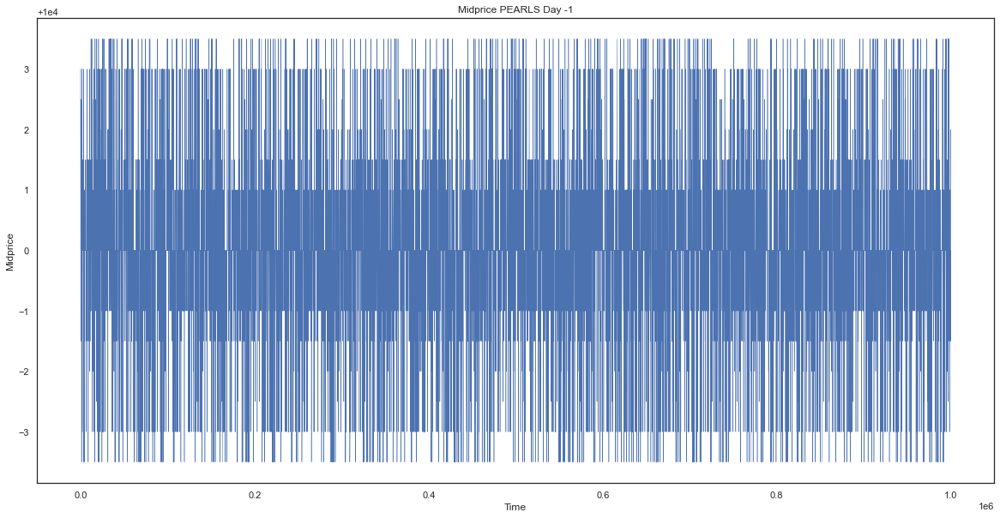

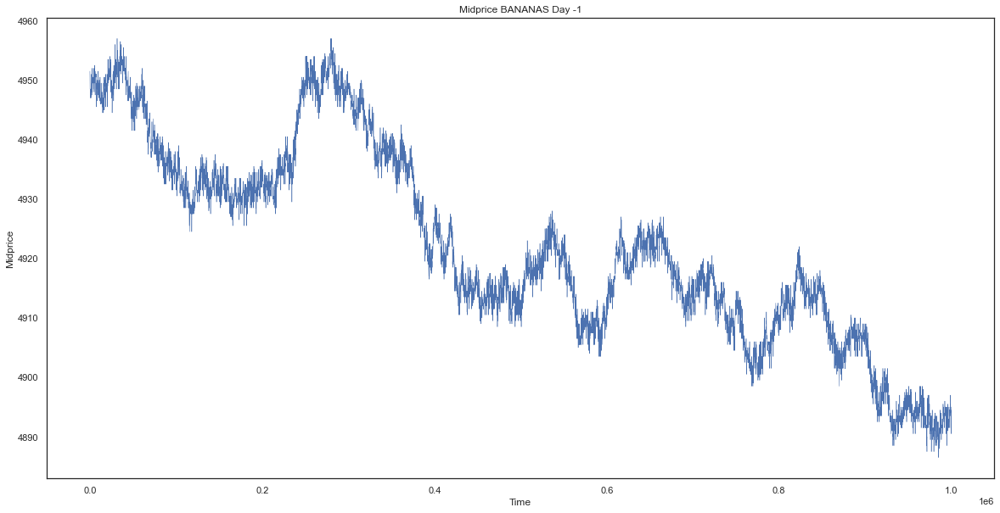

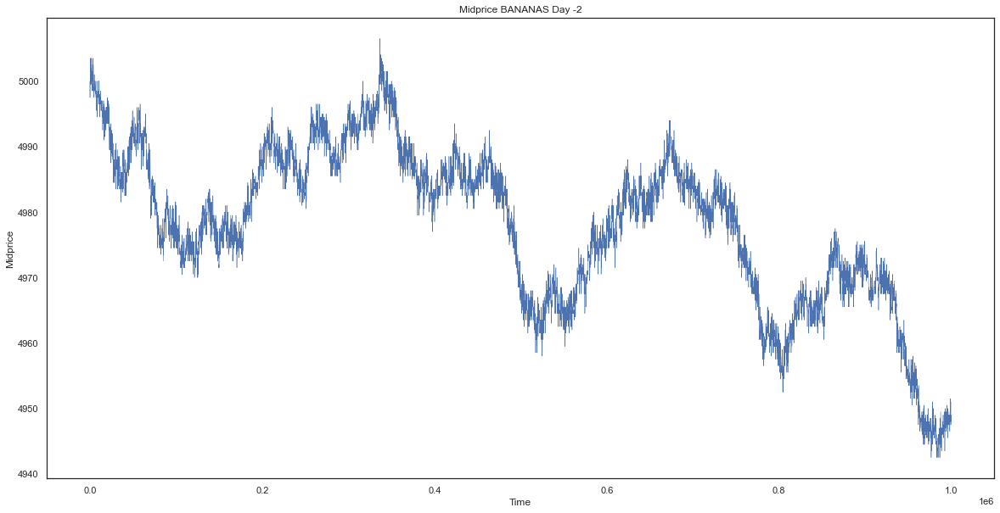

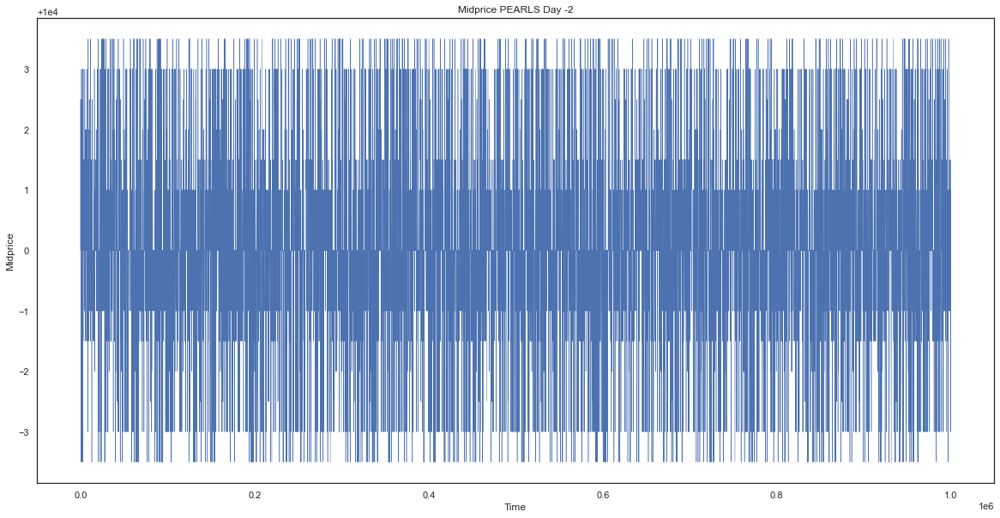

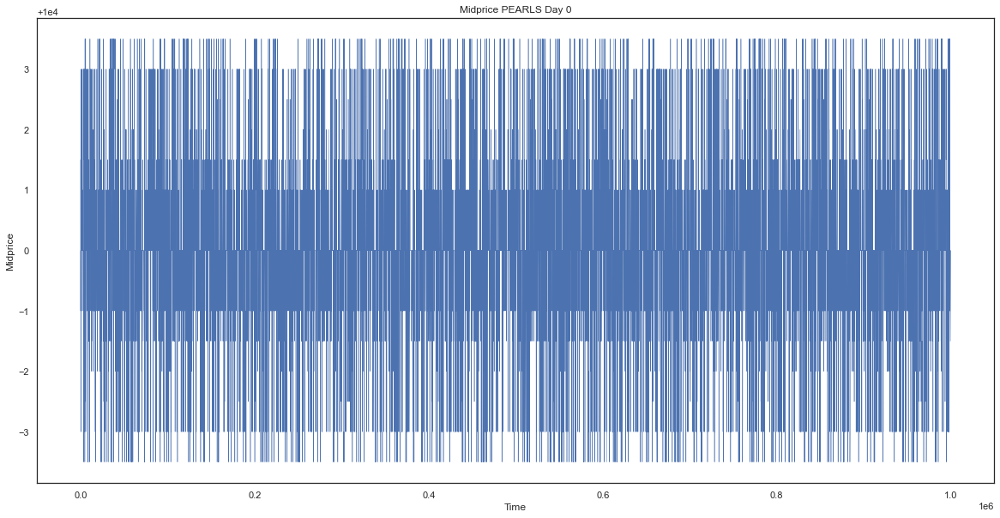

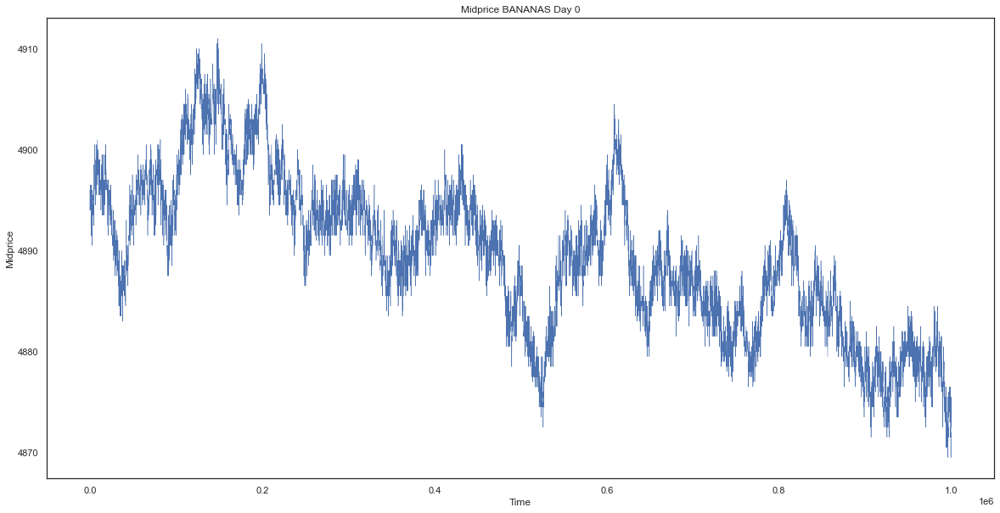

In [5]:
for day, assets in output_dfs.items():
    for asset, data in assets.items():
        plt.plot(data['timestamp'], data['mid_price'], label = asset, linewidth = 0.5)
        plt.xlabel('Time')
        plt.ylabel('Midprice')
        plt.title('Midprice ' + asset + " Day " + day)
        plt.show()

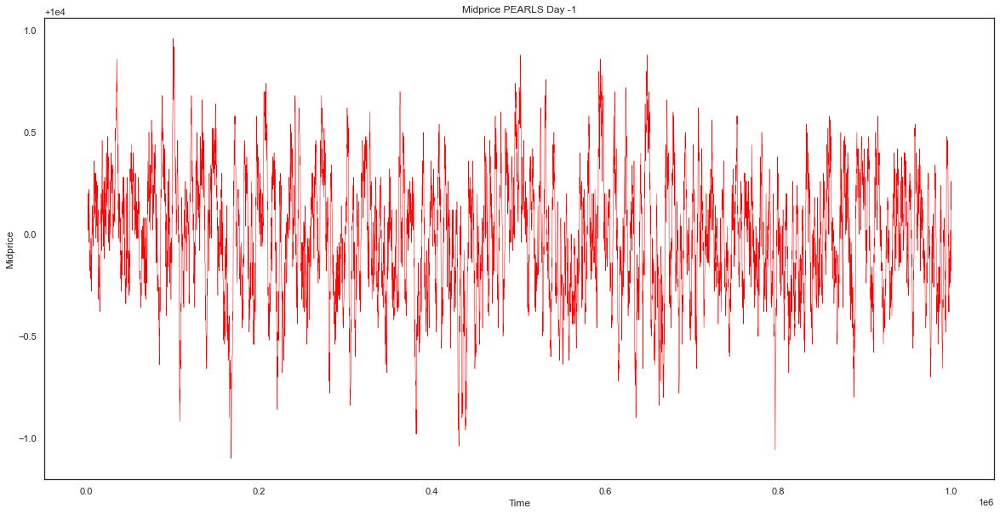

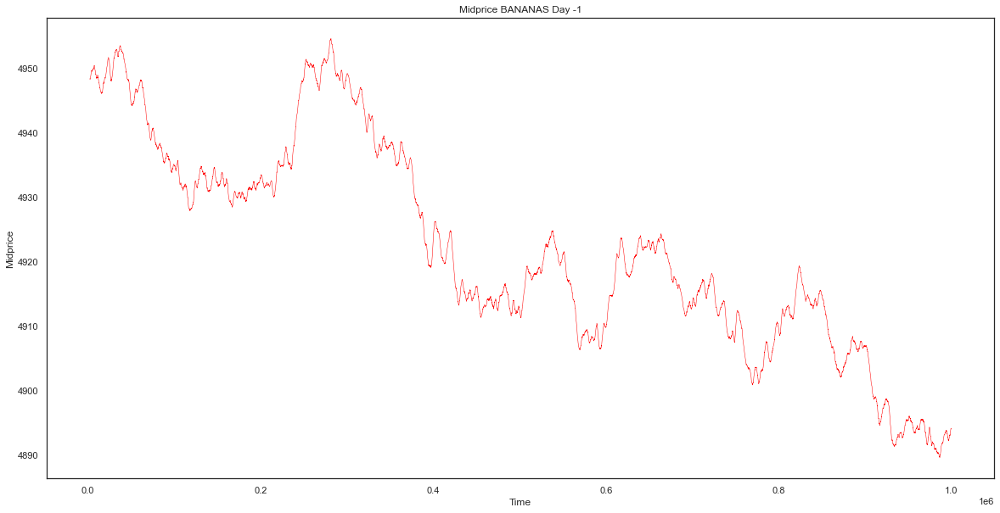

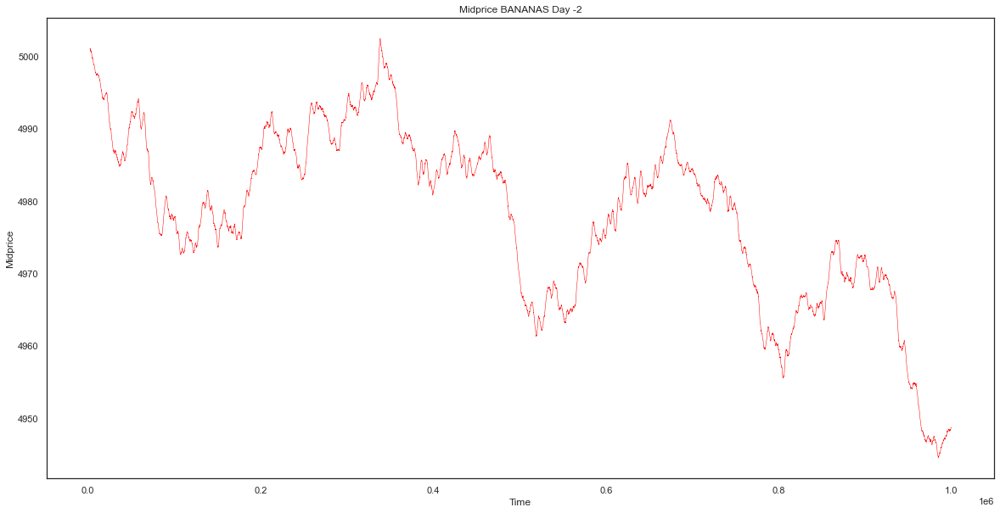

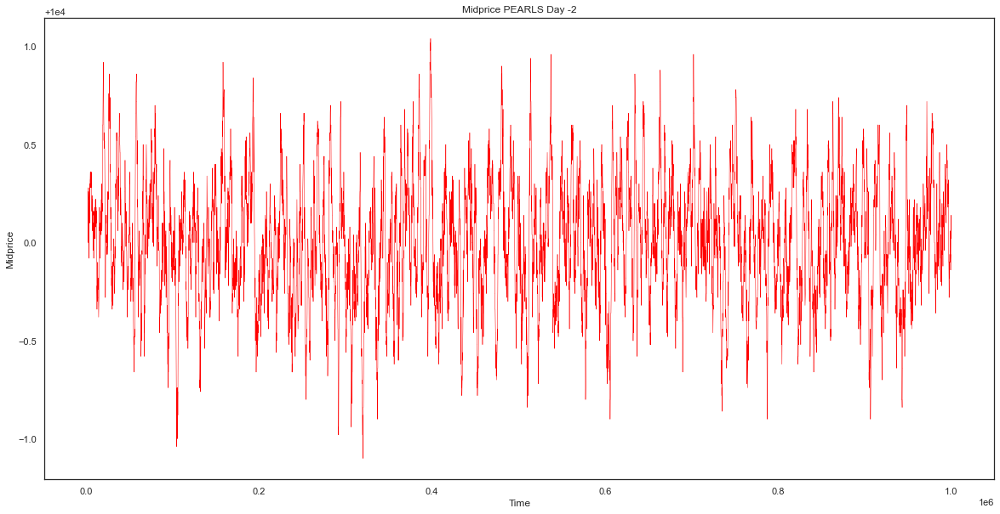

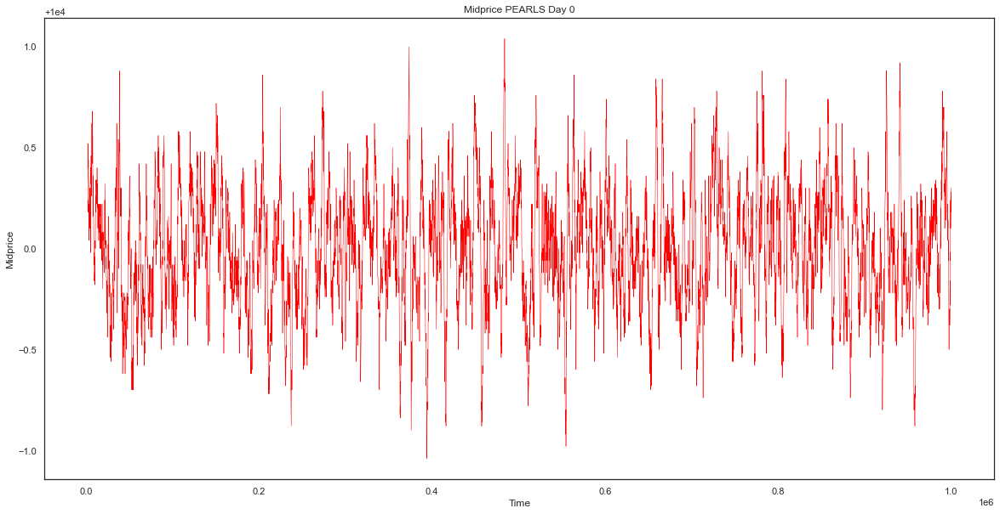

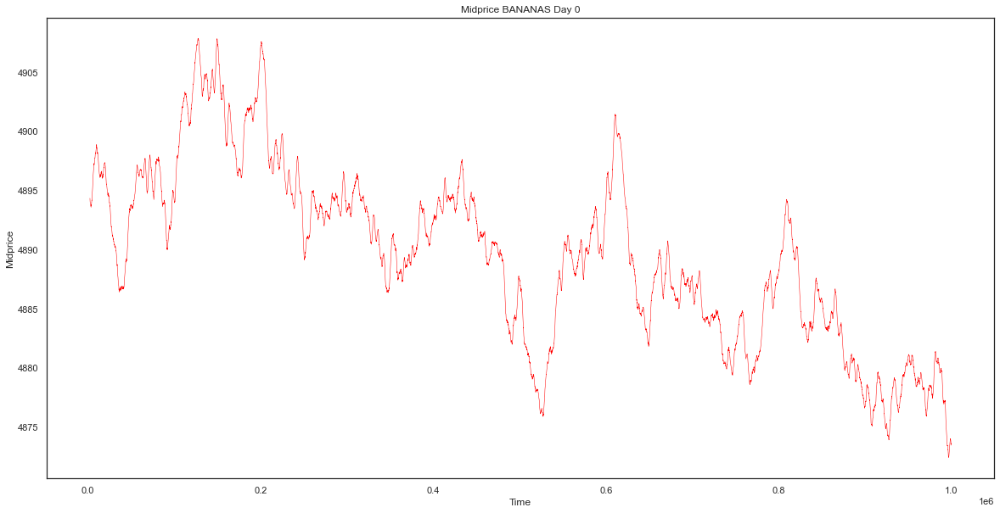

In [6]:
for day, assets in output_dfs.items():
    for asset, data in assets.items():
        periods = 25
        mid_average = data['mid_price'].rolling(window=periods).mean()
        # plt.plot(data['mid_price'] , label = "mid price", linewidth = 0.5, color = "black")
        plt.plot(mid_average , label = str(periods)+"rolling average", linewidth = 0.5, color = "red")
        plt.xlabel('Time')
        plt.ylabel('Midprice')
        # plt.legend()
        plt.title('Midprice ' + asset + " Day " + day)
        plt.show()

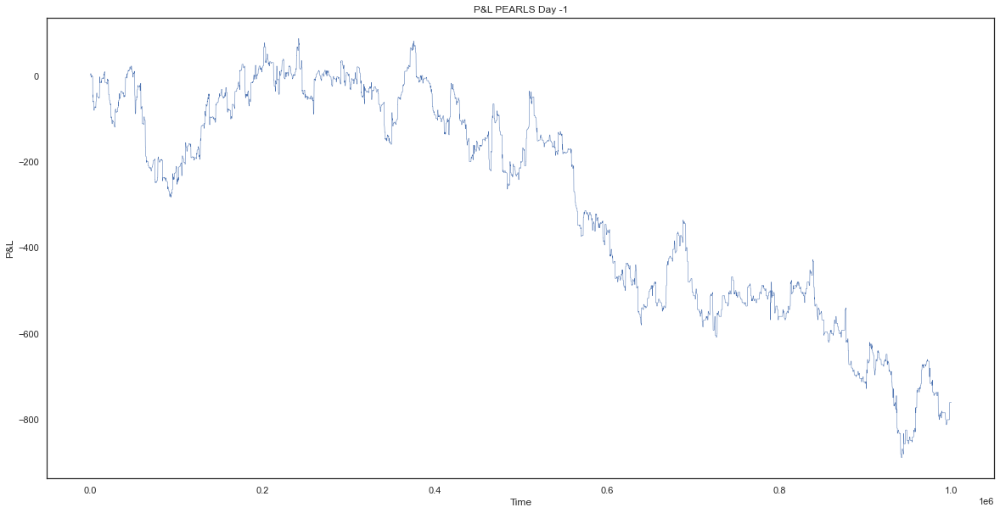

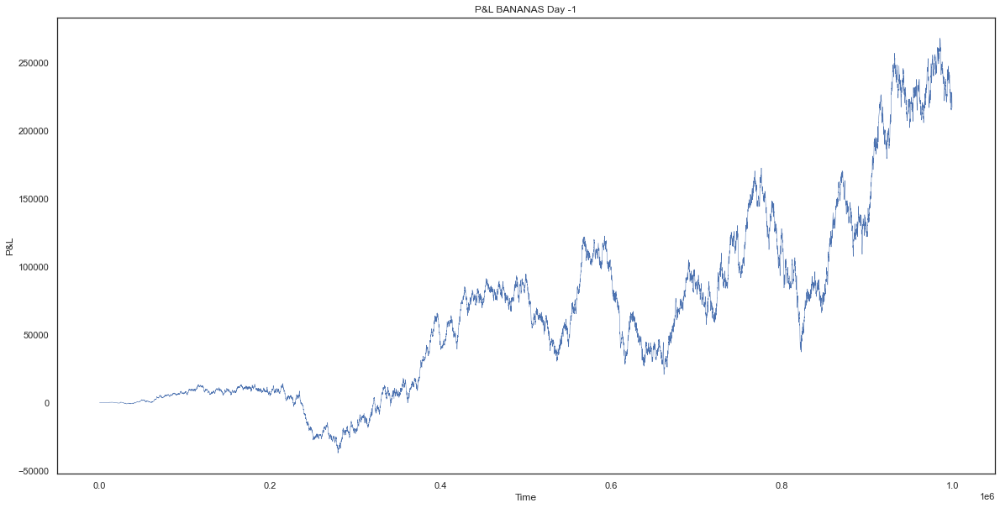

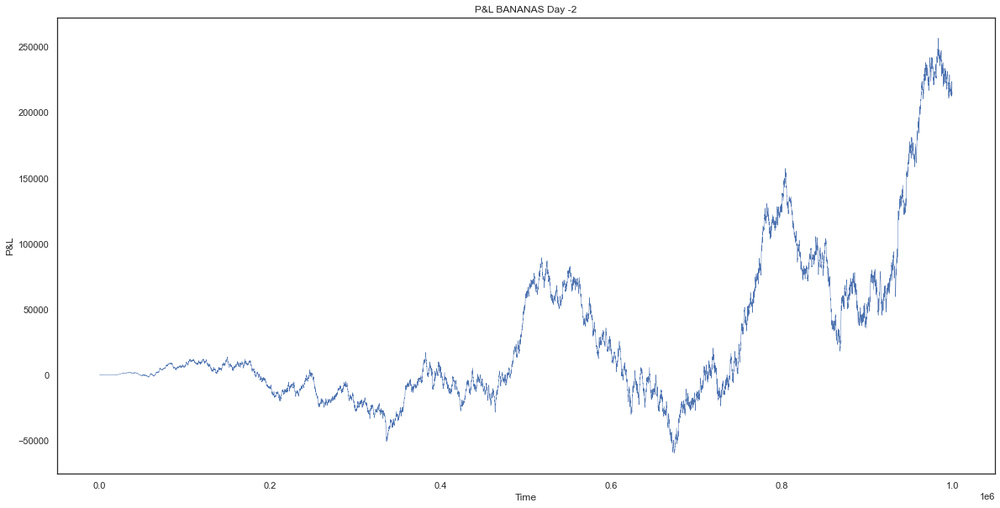

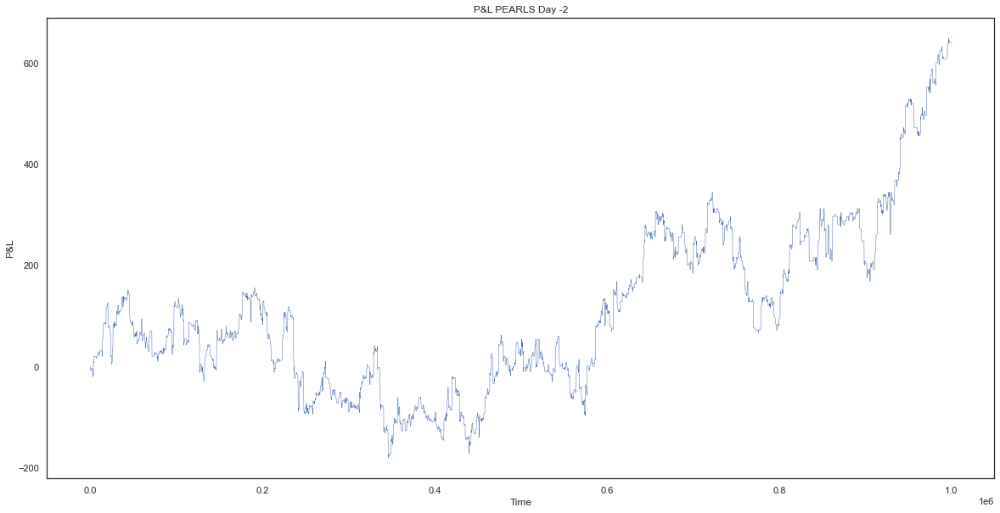

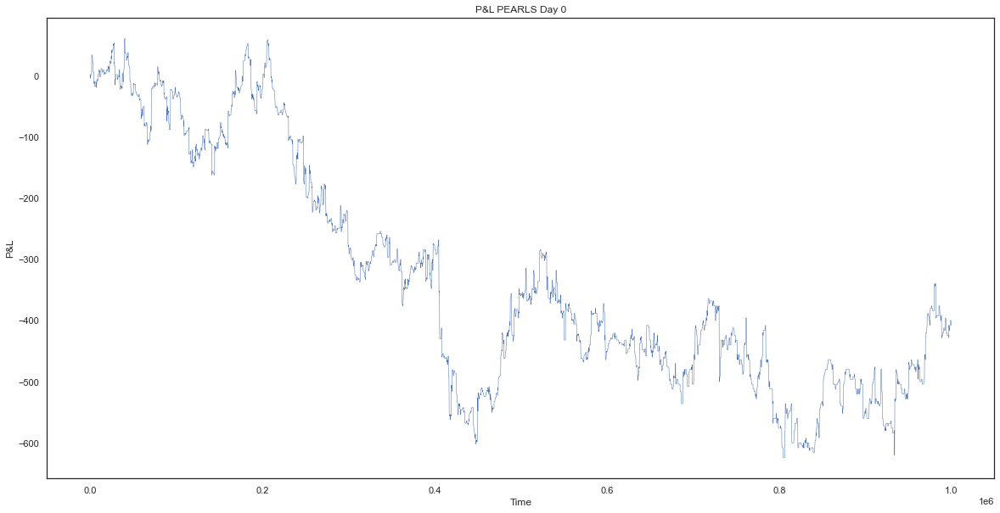

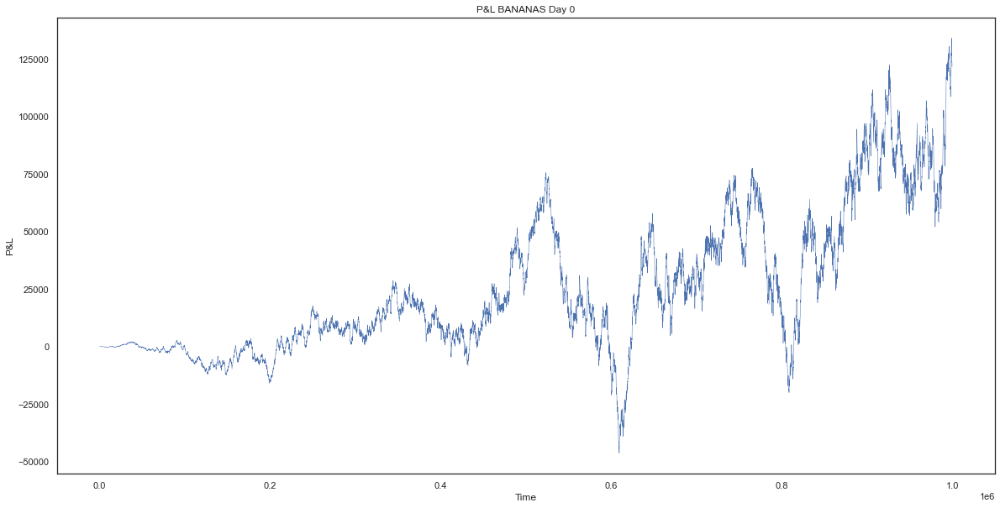

In [7]:
for day, assets in output_dfs.items():
    for asset, data in assets.items():
        plt.plot(data['timestamp'], data['profit_and_loss'], label = asset, linewidth = 0.5)
        plt.xlabel('Time')
        plt.ylabel('P&L')
        plt.title('P&L ' + asset + " Day " + day)
        plt.show()

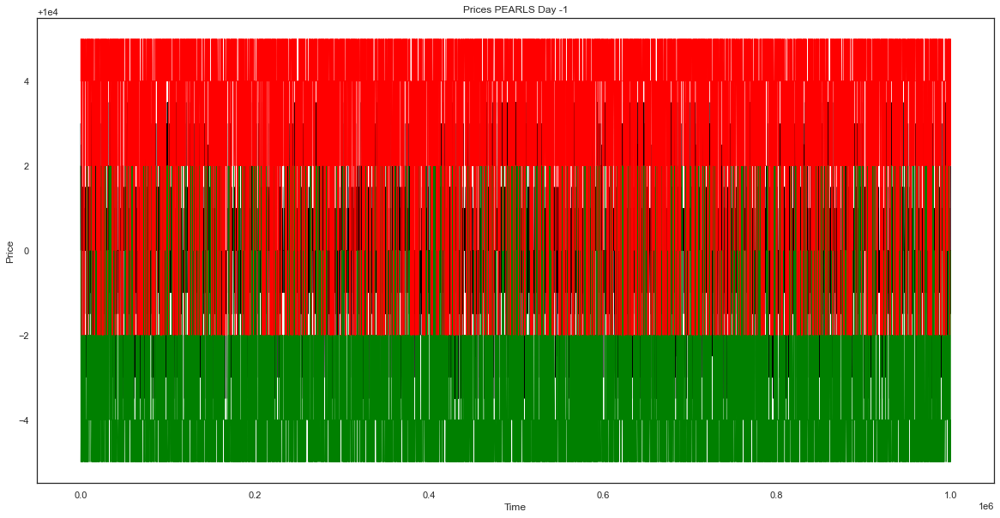

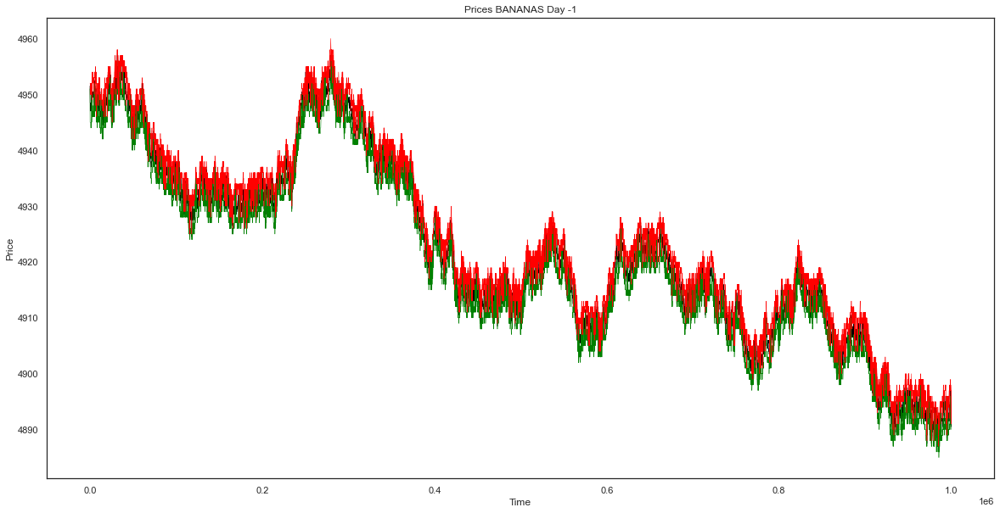

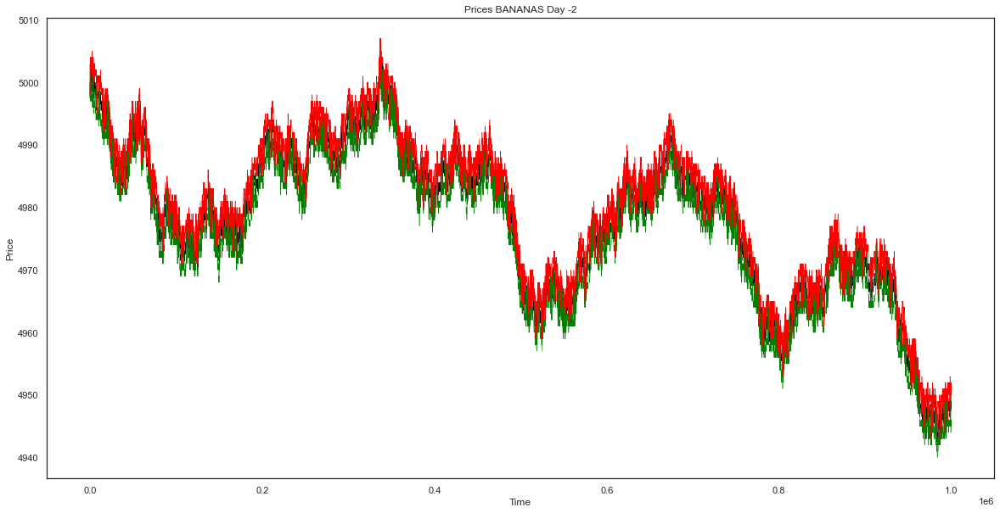

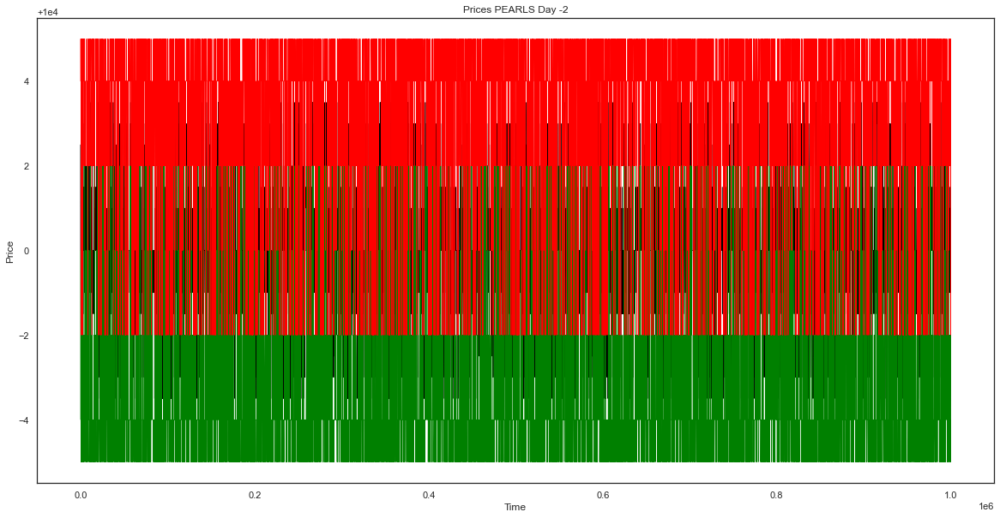

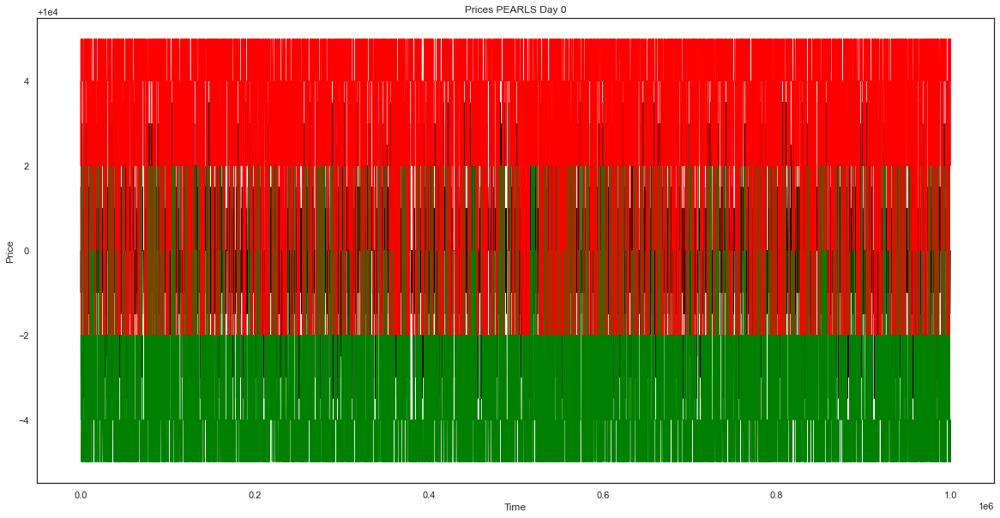

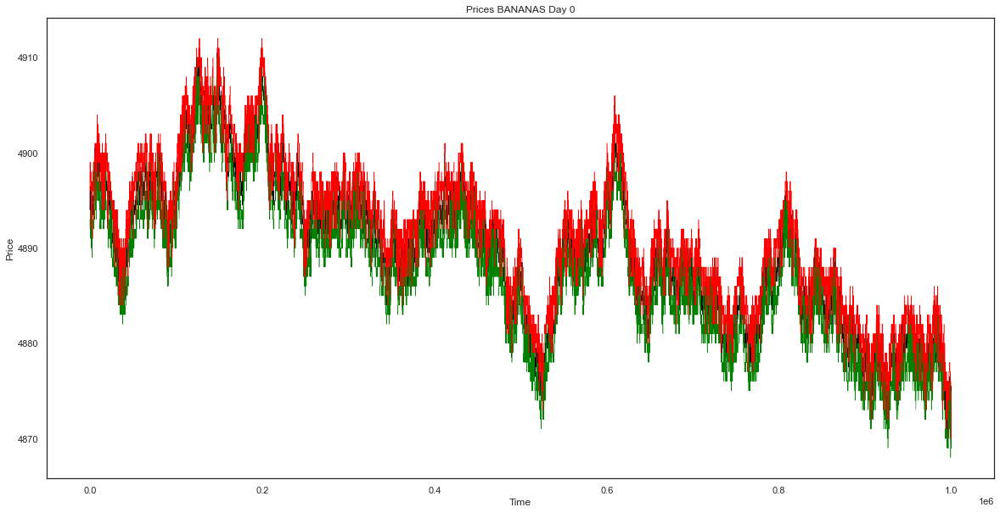

In [8]:
for day, assets in output_dfs.items():
    for asset, data in assets.items():
        plt.plot(data['timestamp'], data['mid_price'], label = asset, linewidth = 0.5, color = 'black')
        plt.plot(data['timestamp'], data['bid_price_1'], label = asset, linewidth = 0.5, color = 'green')
        plt.plot(data['timestamp'], data['ask_price_1'], label = asset, linewidth = 0.5, color = 'red')
        plt.xlabel('Time')
        plt.ylabel('Price')
        plt.title('Prices ' + asset + " Day " + day)
        plt.show()

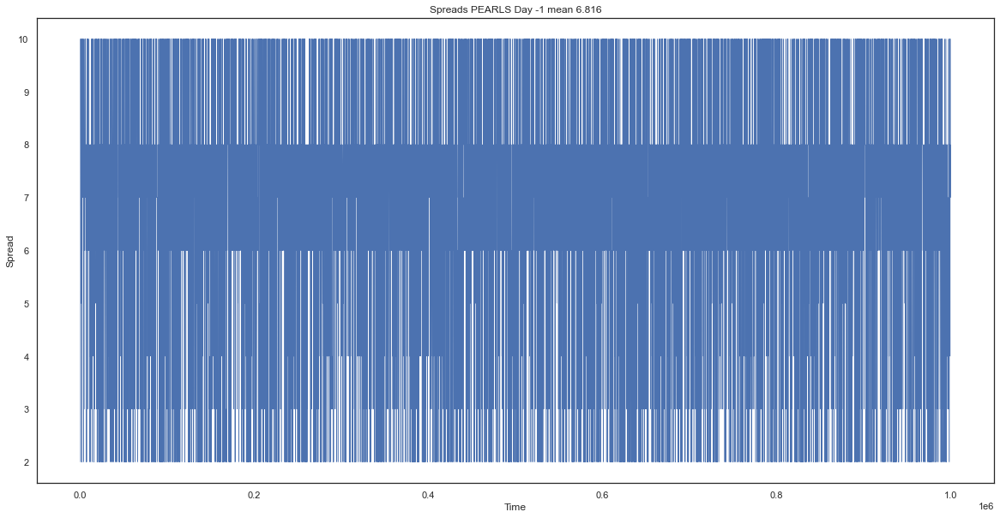

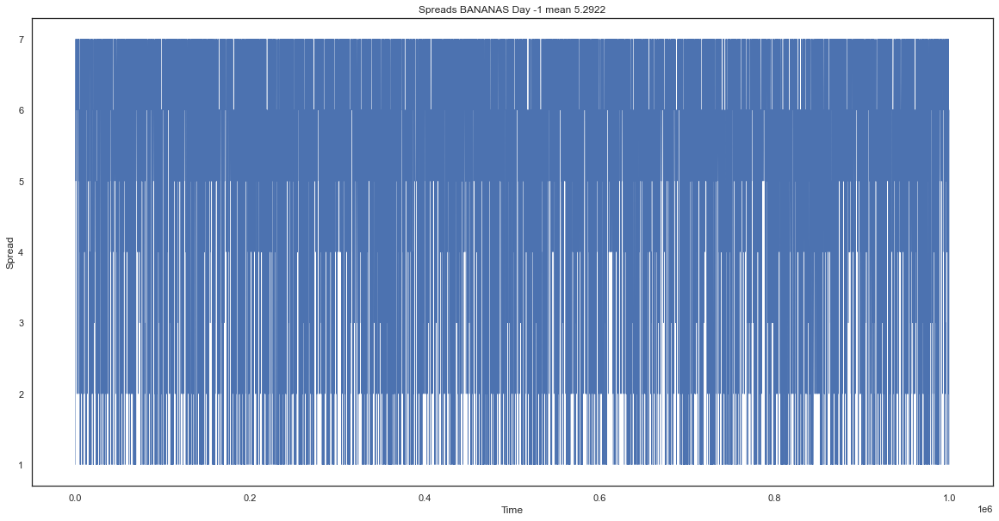

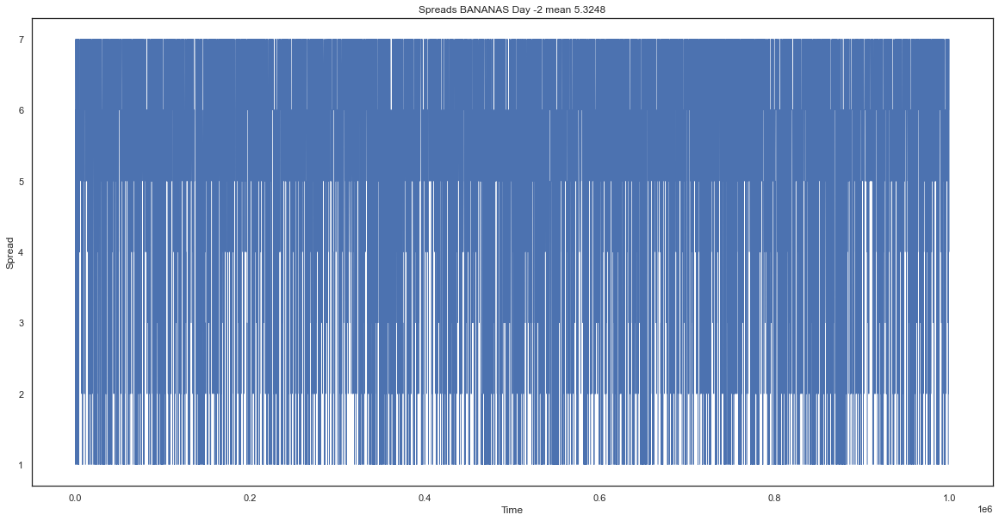

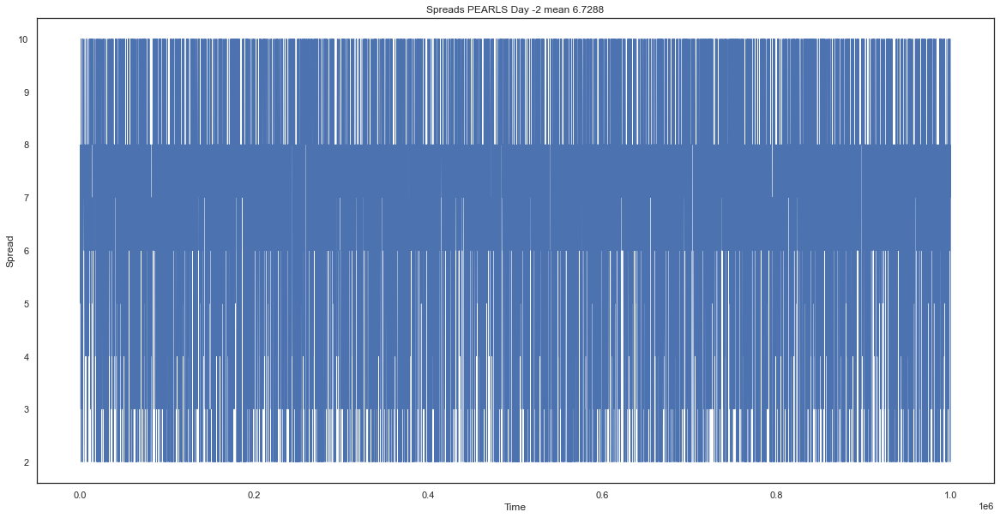

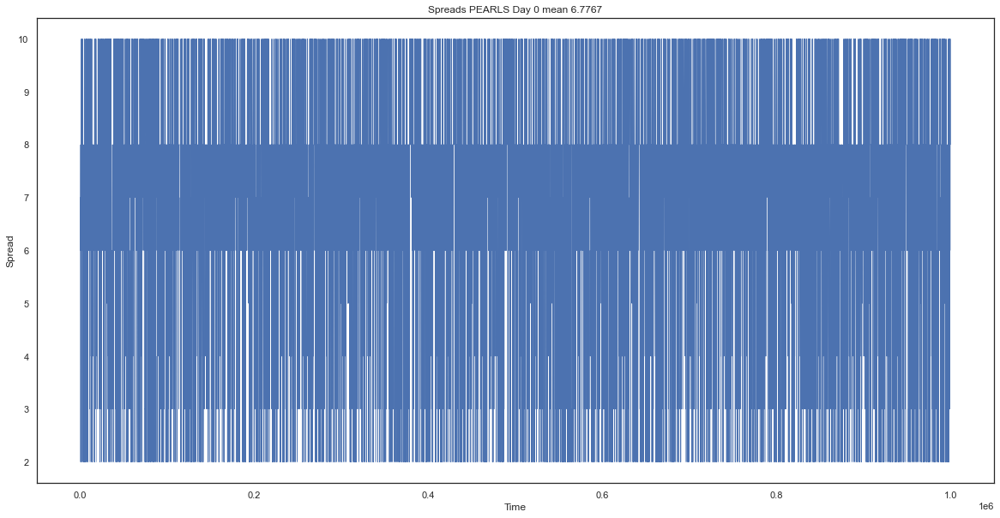

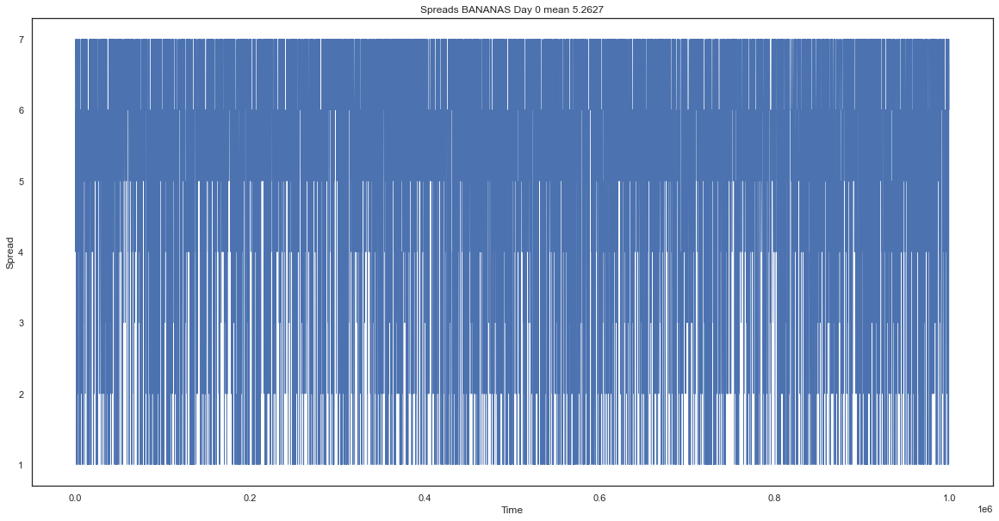

In [9]:
for day, assets in output_dfs.items():
    for asset, data in assets.items():
        plt.plot(data['timestamp'], data['ask_price_1']-data['bid_price_1'], label = asset, linewidth = 0.5)
        mean = (data['ask_price_1']-data['bid_price_1']).mean()
        plt.xlabel('Time')
        plt.ylabel('Spread')
        plt.title('Spreads ' + asset + " Day " + day + ' mean ' + str(mean))
        plt.show()

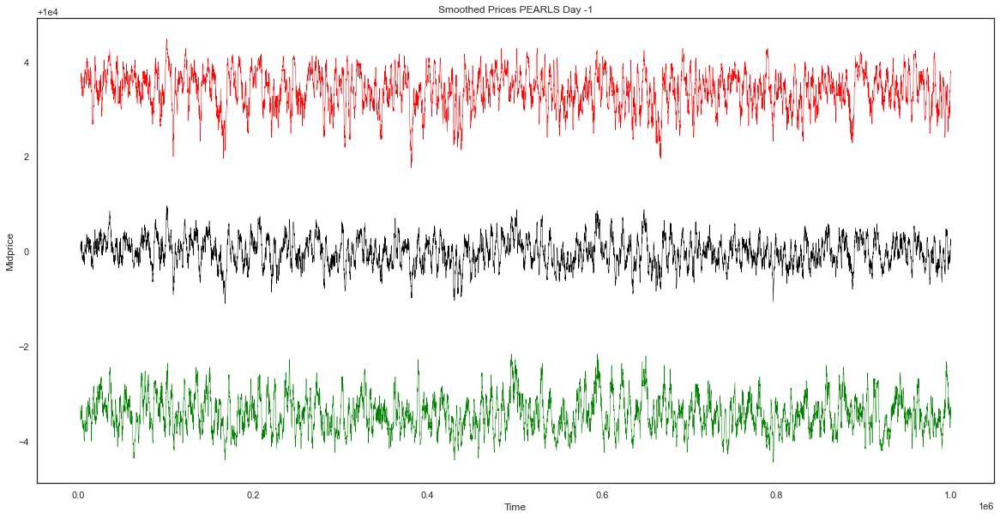

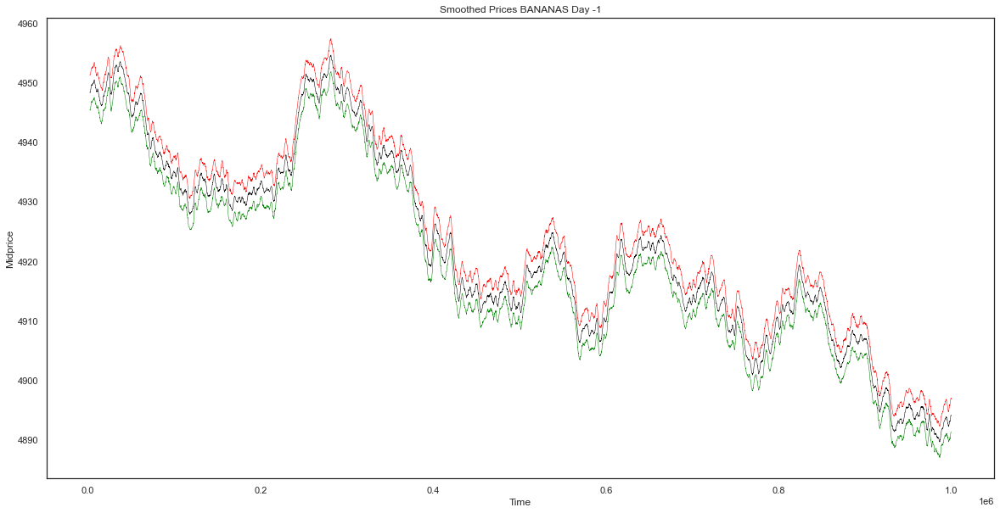

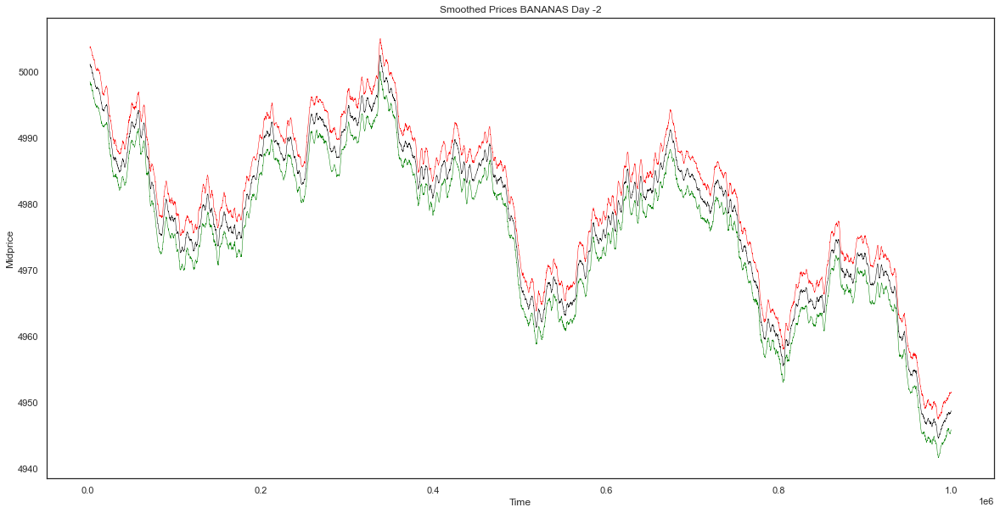

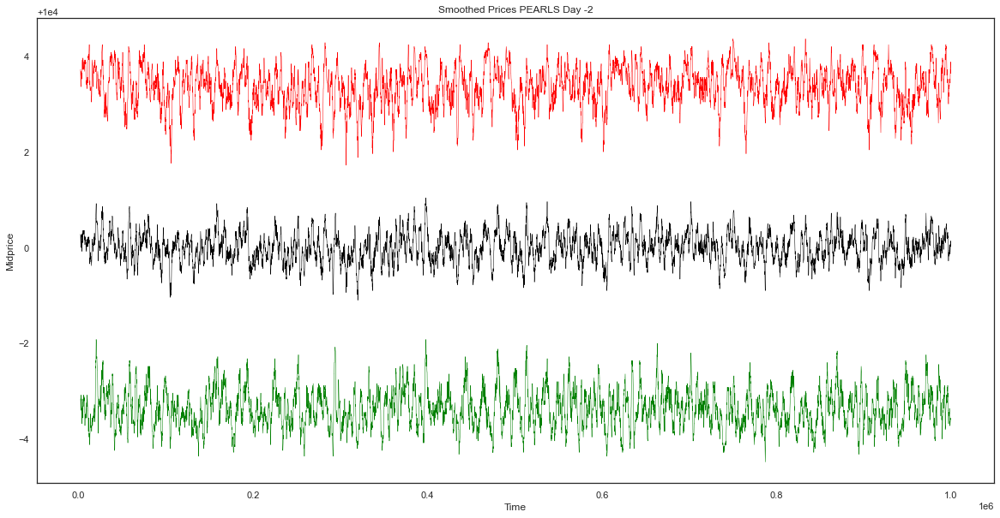

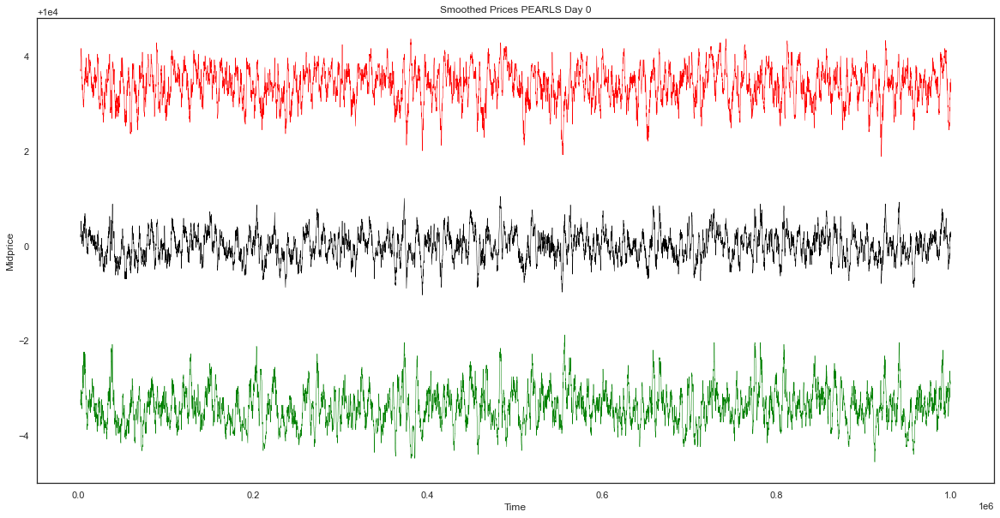

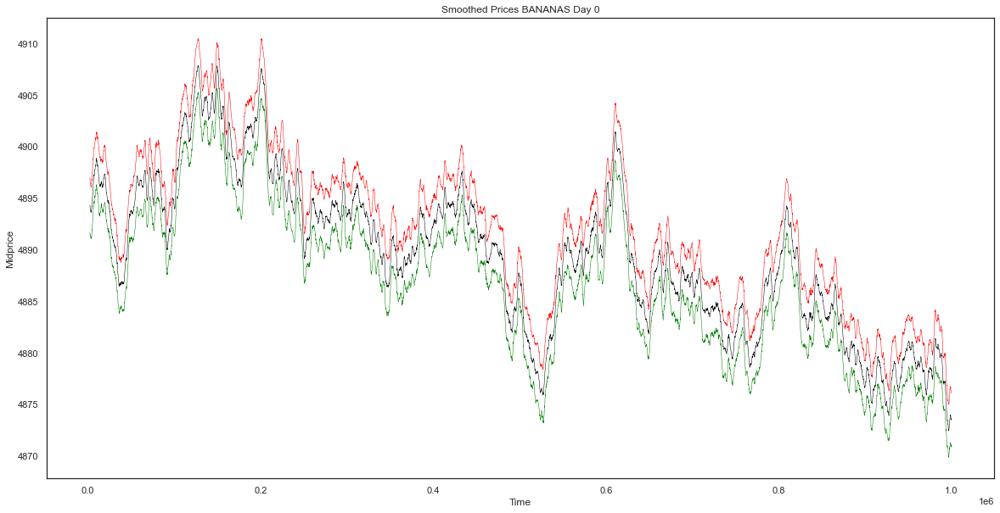

In [10]:
for day, assets in output_dfs.items():
    for asset, data in assets.items():
        periods = 25
        mid_average = data['mid_price'].rolling(window=periods).mean()
        bid_average = data['bid_price_1'].rolling(window=periods).mean()
        ask_average = data['ask_price_1'].rolling(window=periods).mean()
        plt.plot(bid_average, label = asset, linewidth = 0.5, color = 'green')
        plt.plot(ask_average , label = asset, linewidth = 0.5, color = 'red')
        plt.plot(mid_average , label = str(periods)+"rolling average", linewidth = 0.5, color = "black")
        plt.xlabel('Time')
        plt.ylabel('Midprice')
        # plt.legend()
        plt.title("Smoothed Prices " + asset + " Day " + day)
        plt.show()

[ 149  272  475 1316 1492 1533 1606 1883 1885 1900 2147 2185 2939 4797
 4933 5064 5518 6012 6724 7107 7281 7877 8394 8870 9038 9531 9626 9632
 9651 9670 9671 9672 9673 9979]


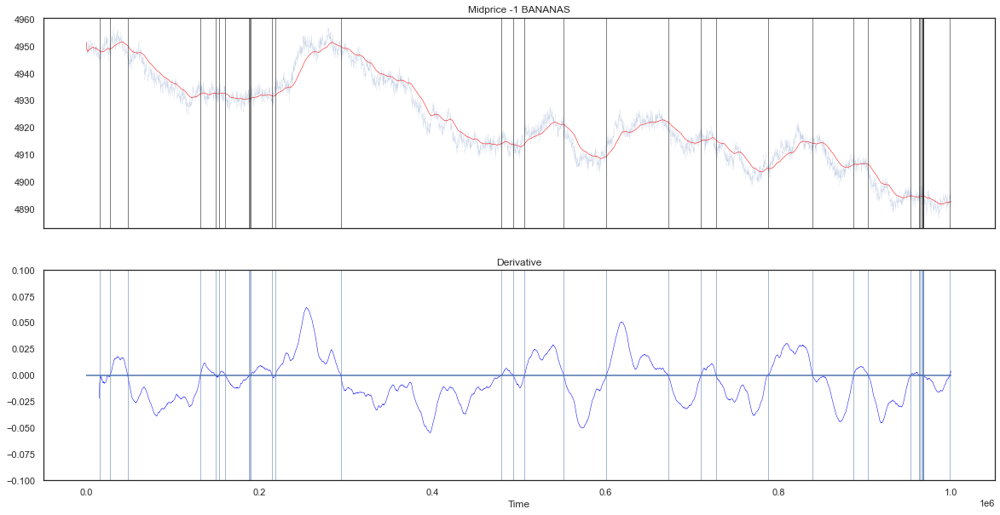

[ 149  511  696 1312 1507 1812 2270 2575 2814 2990 3549 4125 4384 4578
 4728 5353 5502 5662 6880 7316 7413 8182 8519 8538 8814 8925 9069 9249
 9271 9272 9273 9997]


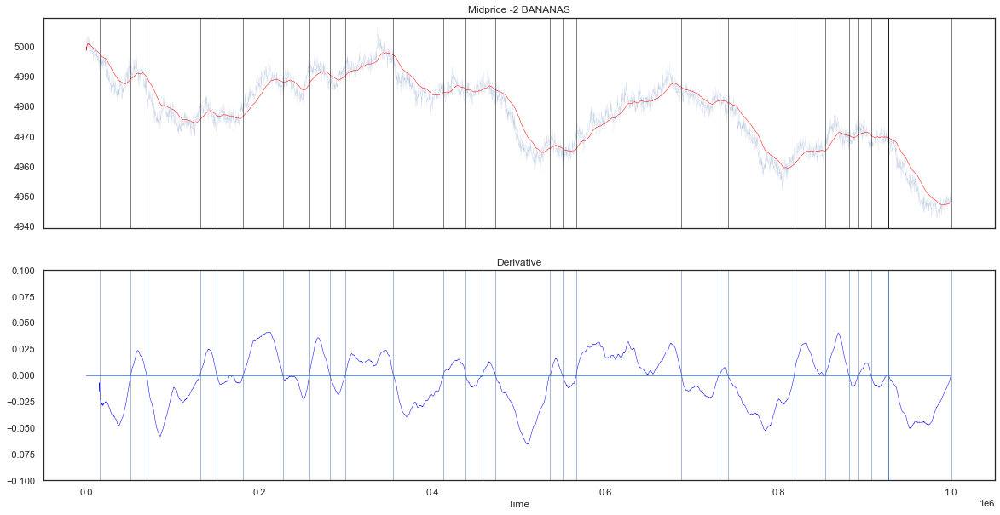

[ 233  513  866 1048 1462 1464 1581 1874 2116 2687 2738 2827 2835 2836
 3232 3756 4448 5378 6255 6606 6789 6791 6792 6795 6810 6974 7020 7076
 7077 7556 7662 7813 8241 8488 8558 9398 9670 9828 9937]


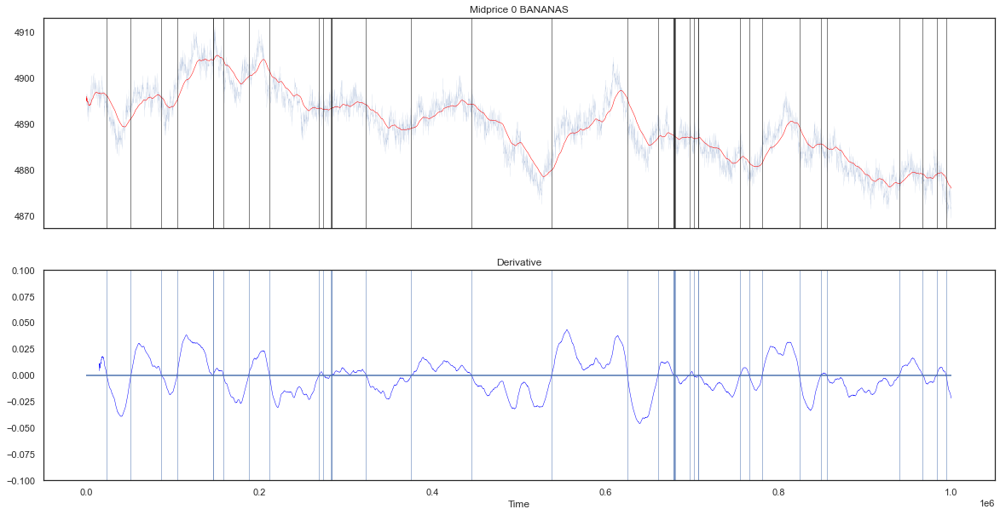

In [38]:
for day, assets in output_dfs.items():
    for asset, data in assets.items():
        if asset == 'BANANAS':
            periods = 1000
            short_periods = 150
            mid_average = data['mid_price'].ewm(halflife = periods/2).mean()
            mid_short_average = data['mid_price'].ewm(halflife = short_periods/2).mean()
            # plt.plot(data['mid_price'] , label = asset, linewidth = 0.05, color = 'blue')
            # plt.plot(mid_short_average , label = asset, linewidth = 0.5, color = 'red')
            # # plt.plot(mid_average , label = str(periods)+"rolling average", linewidth = 0.5, color = "black")
            # plt.xlabel('Time')
            # plt.ylabel('Midprice')
            # # plt.legend()
            # plt.title("Smoothed Prices " + asset + " Day " + day)
            # plt.show()
            # plt.ylim(-0.1,0.1)
            # plt.plot(pd.Series(data['mid_price'].diff(10)).ewm(halflife = periods).mean(), label = "difference short minus long", linewidth = 0.5, color = 'blue')
            # plt.axhline(0)
            # plt.xlabel('Time')
            # plt.ylabel('Gradient')
            # # plt.legend()
            # plt.title("Differences " + asset + " Day " + day)
            # plt.show()
            velocity = pd.Series(mid_short_average.diff(1)).rolling(window = 150).mean()
            zeros = velocity.index[(velocity < 0.00005) & (velocity > -0.00005)].tolist()
            new_zeros = np.where(np.diff(np.signbit(velocity)))[0]
            # print(mid_short_average.head(50))
            # print(velocity.head(50))
            print(new_zeros)
            fig, axs = plt.subplots(2, sharex=True)
            axs[0].plot(data['timestamp'], data['mid_price'] , linewidth = 0.05)
            axs[0].plot(data['timestamp'], mid_short_average , linewidth = 0.5, color = 'red')
            axs[0].title.set_text(str('Midprice '+ str(day)+ ' '+ asset))
            y0, y1 = axs[0].get_ylim()
            axs[0].set_ylim(y0, y1)
            axs[0].vlines(data['timestamp'].iloc[new_zeros], y0, y1, linewidth = 0.5, color = 'black')
            axs[1].plot(data['timestamp'], velocity, label = "difference short minus long", linewidth = 0.5, color = 'blue')
            axs[1].set_ylim(-0.1,0.1)
            axs[1].hlines(0, 0, 1000000)
            axs[1].vlines(data['timestamp'].iloc[new_zeros], -0.1, 0.1, linewidth = 0.5)
            axs[1].title.set_text(str('Derivative'))
            # # axs[1].set_xlabel('Time')
            # axs[2].plot(data['timestamp'], pd.Series(mid_short_average.diff(1)).rolling(window = 150).mean().diff().rolling(window = 150).mean(), label = "difference short minus long", linewidth = 0.5, color = 'blue')
            # axs[2].set_ylim(-0.001,0.001)
            # axs[2].hlines(0, 0, 1000000)
            # axs[2].title.set_text(str('Derivative'))
            axs[1].set_xlabel('Time')
            plt.show()


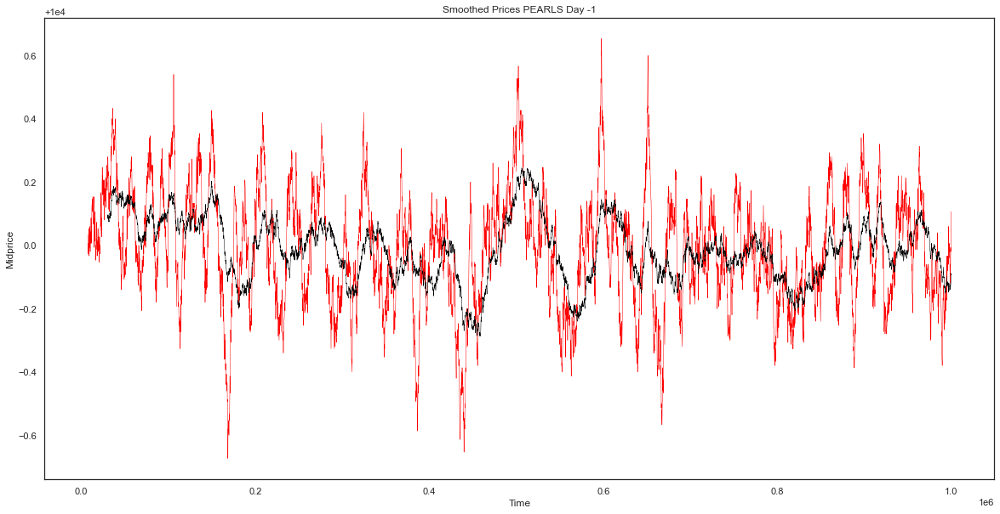

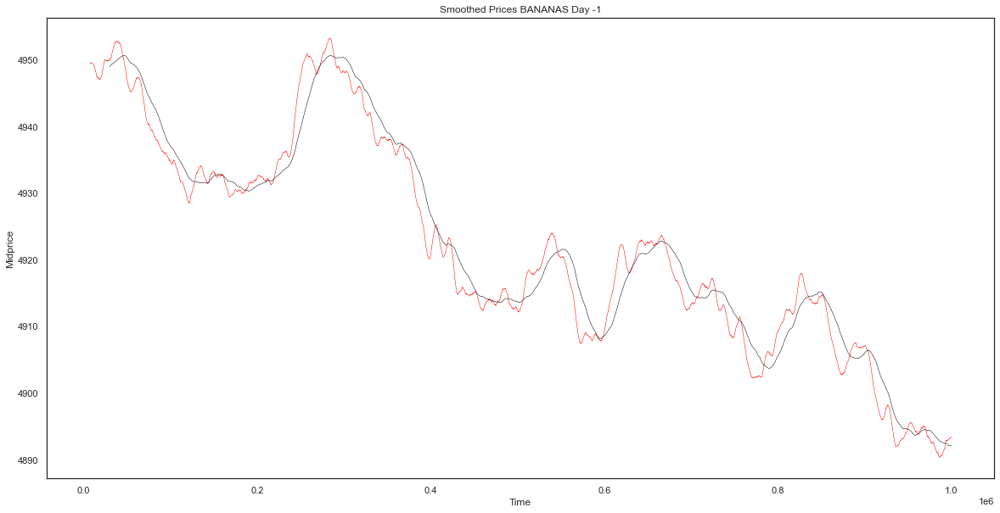

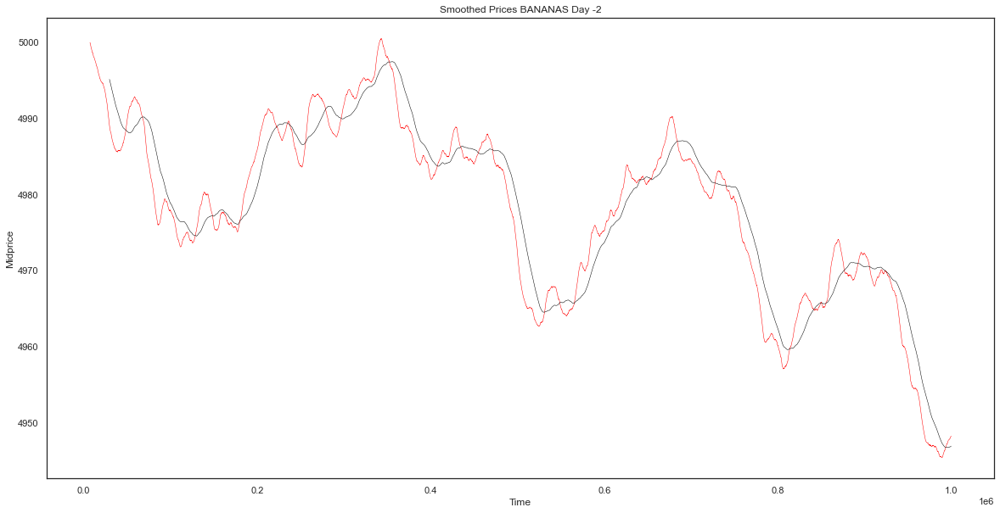

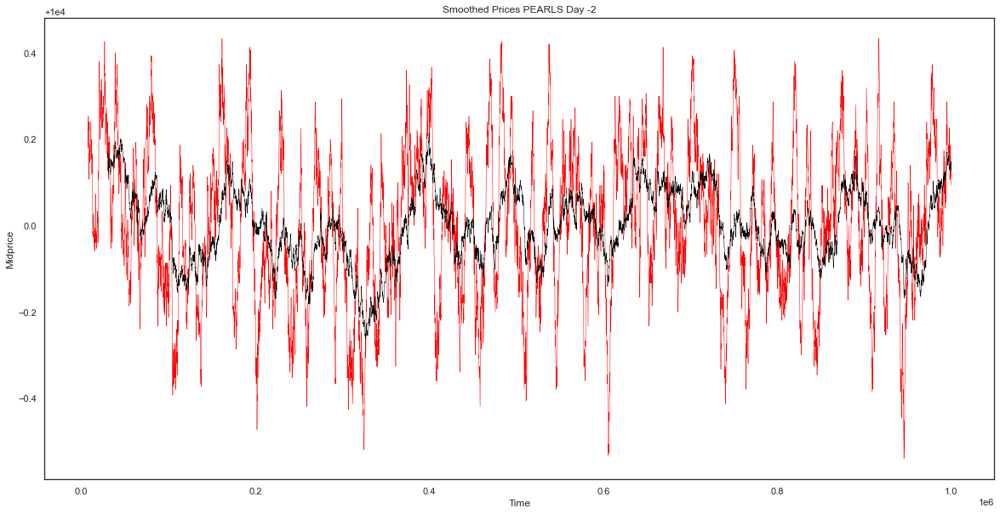

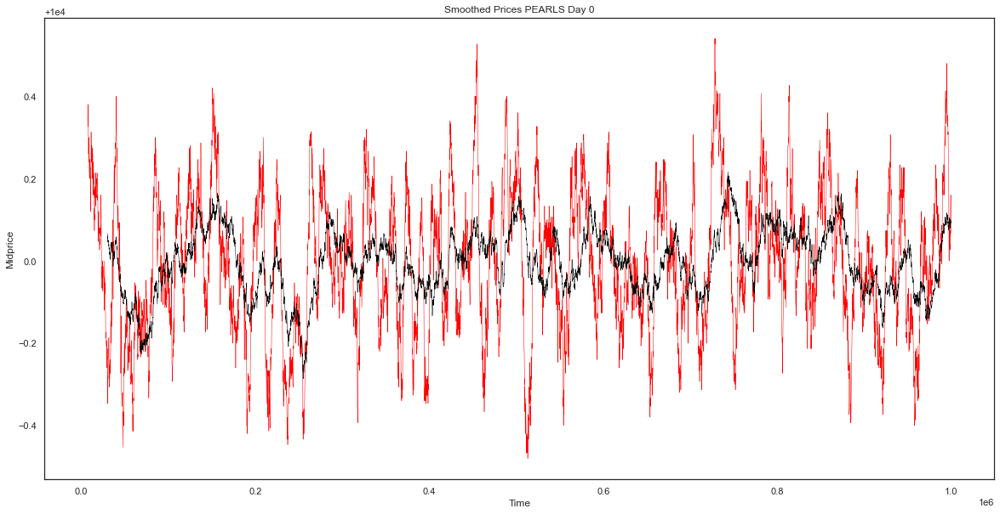

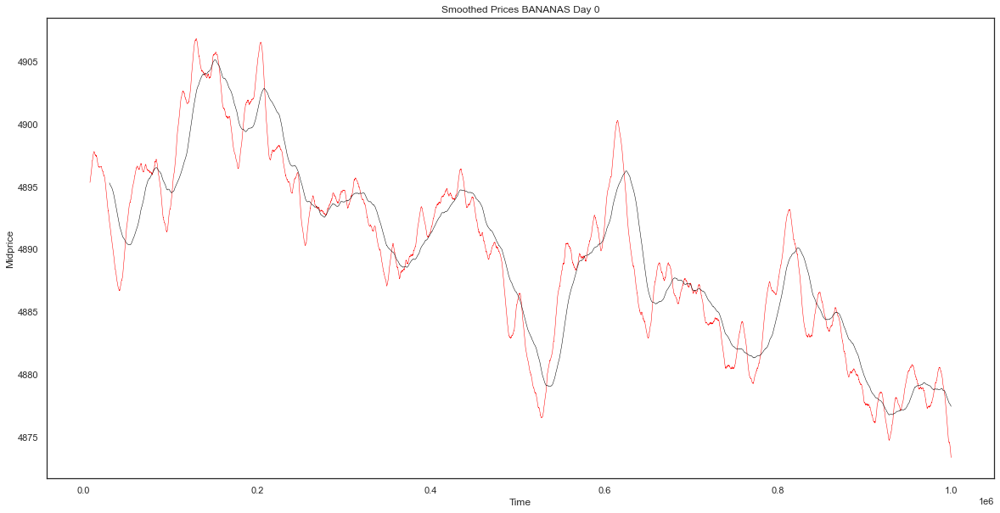

In [12]:
for day, assets in output_dfs.items():
    for asset, data in assets.items():
        periods = 300
        short_periods = 75
        mid_average = data['mid_price'].rolling(window=periods).mean()
        mid_short_average = data['mid_price'].rolling(window=short_periods).mean()
        plt.plot(mid_short_average , label = asset, linewidth = 0.5, color = 'red')
        plt.plot(mid_average , label = str(periods)+"rolling average", linewidth = 0.5, color = "black")
        plt.xlabel('Time')
        plt.ylabel('Midprice')
        # plt.legend()
        plt.title("Smoothed Prices " + asset + " Day " + day)
        plt.show()

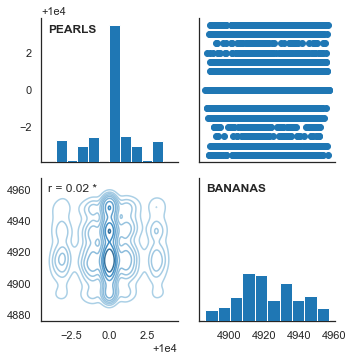

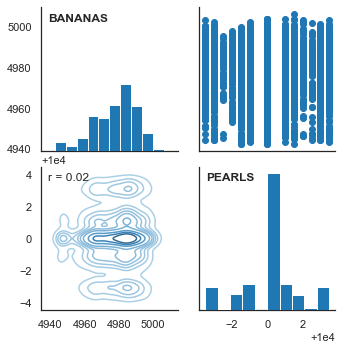

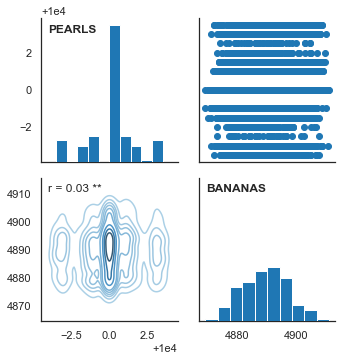

In [13]:
for day, assets in output_dfs.items():
    # set the time to the index
    dfs = [asset.set_index('timestamp') for _, asset in assets.items()]
    # keep only the midprice
    dfs = [df[["product", "mid_price"]] for df in dfs]
    dfs = [df.add_suffix("_" + df["product"][0]) for df in dfs]
    df = pd.concat(dfs, axis=1)
    # strip out the product columns
    df = df[df.columns.drop(list(df.filter(regex='product')))]
    # strip out the mid_price_prefix
    df.columns = df.columns.str.lstrip('mid_price_')
    cor_matrix(df)

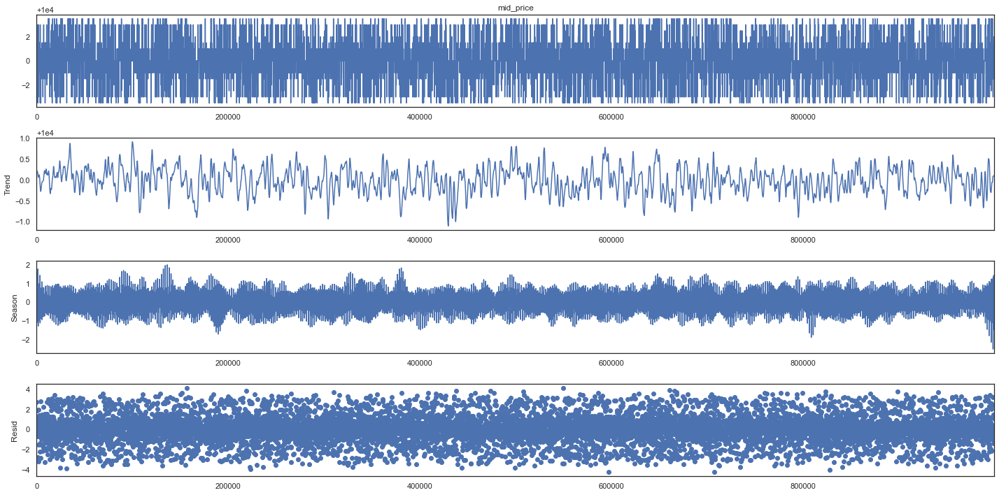

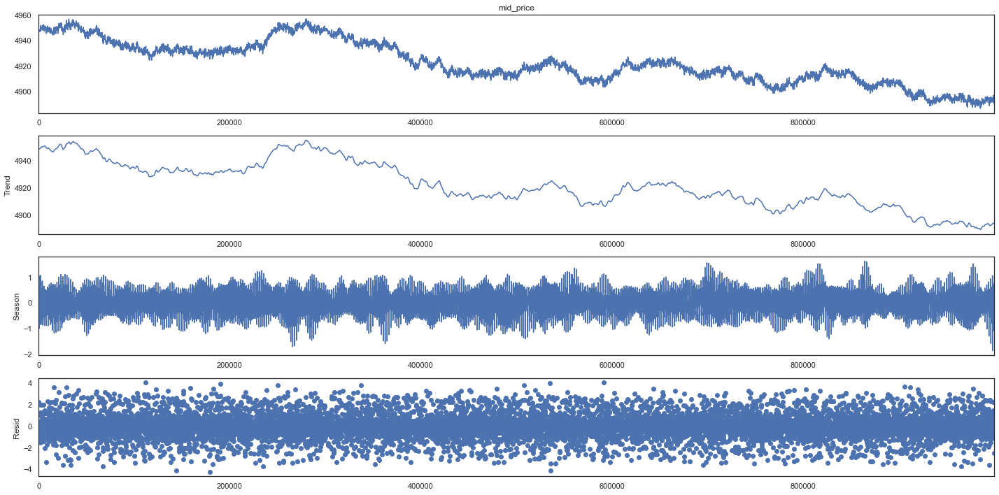

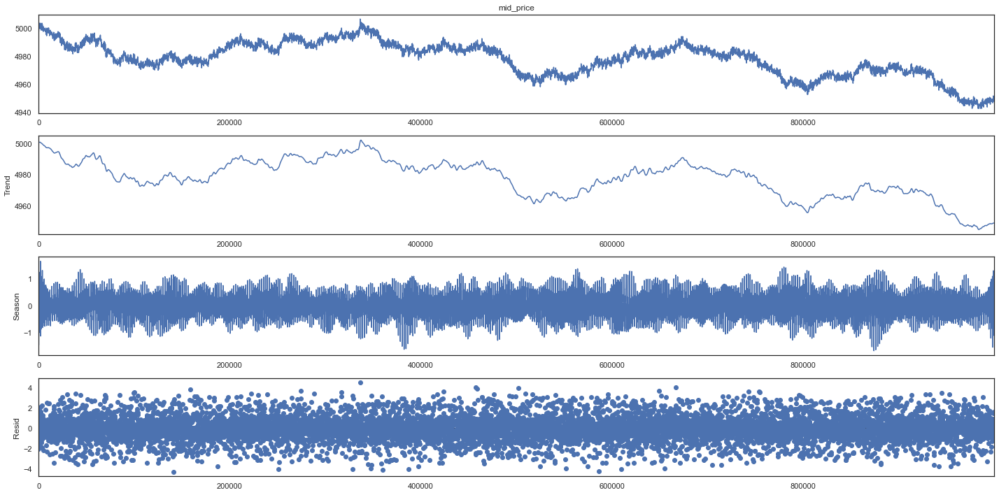

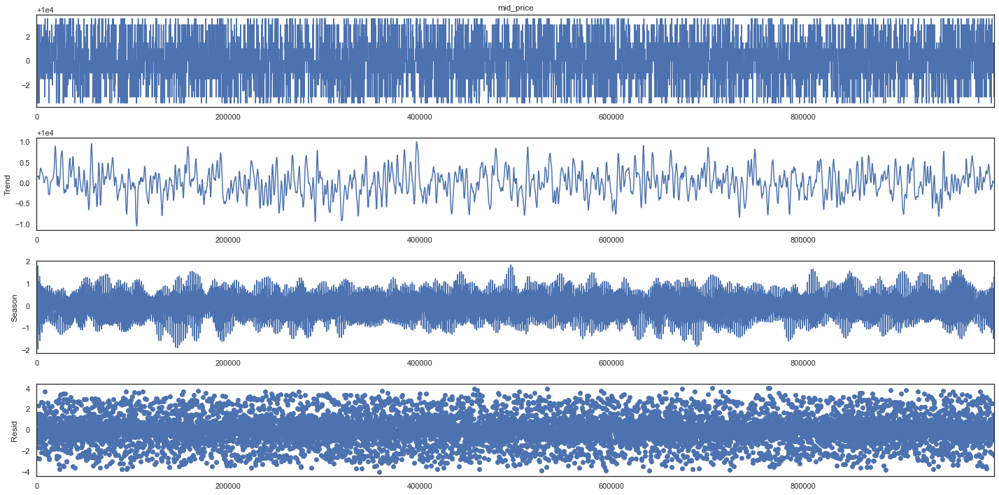

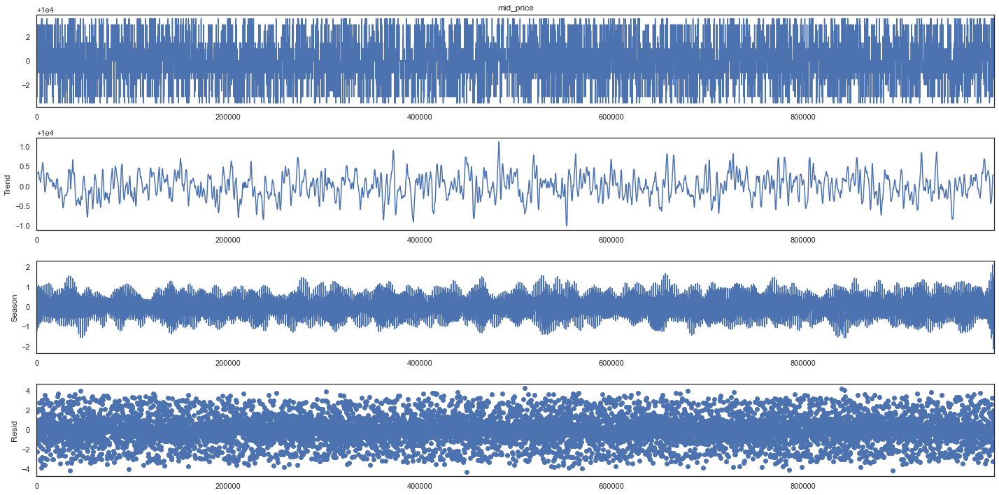

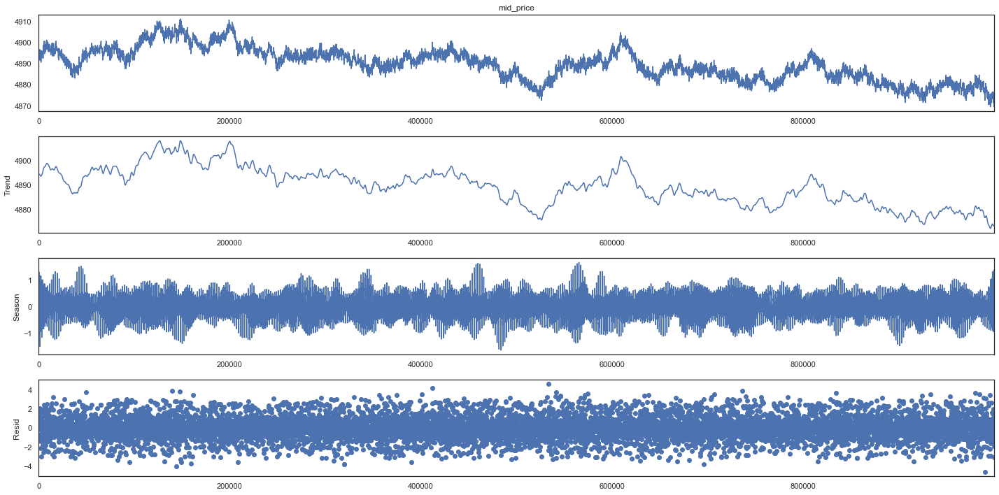

In [14]:
for day, assets in output_dfs.items():
    for asset, data in assets.items():
        stl = STL(data['mid_price'], seasonal=13, period = 20)
        res = stl.fit()
        fig = res.plot()

[1]
1


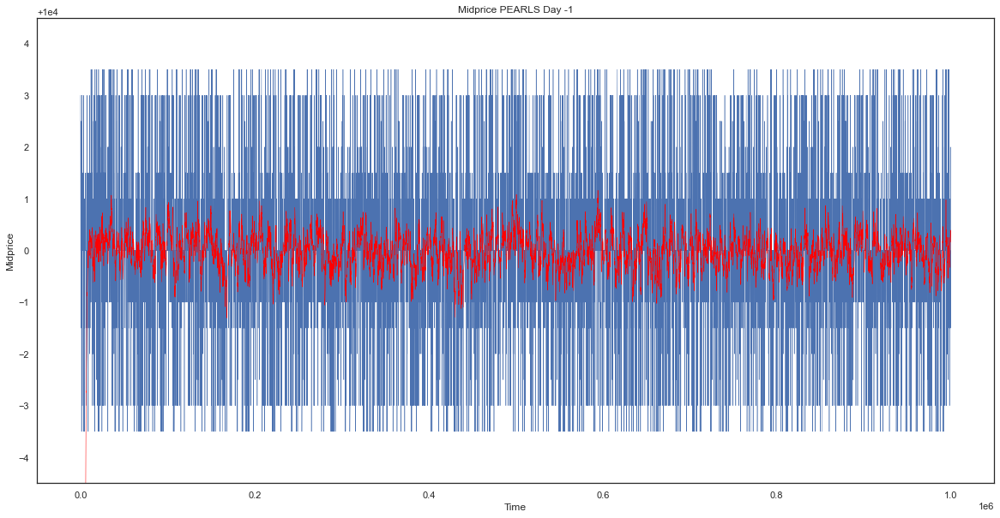

[1]
1


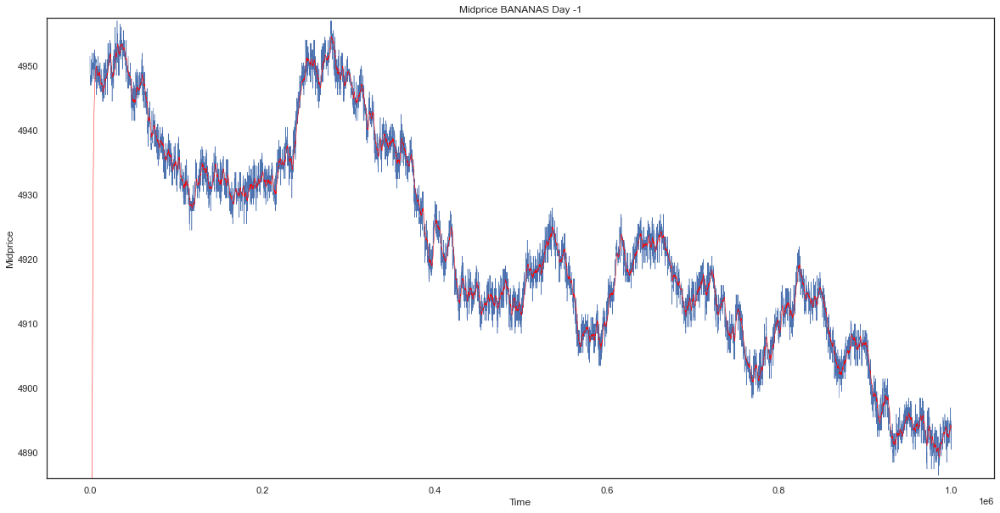

[1]
1


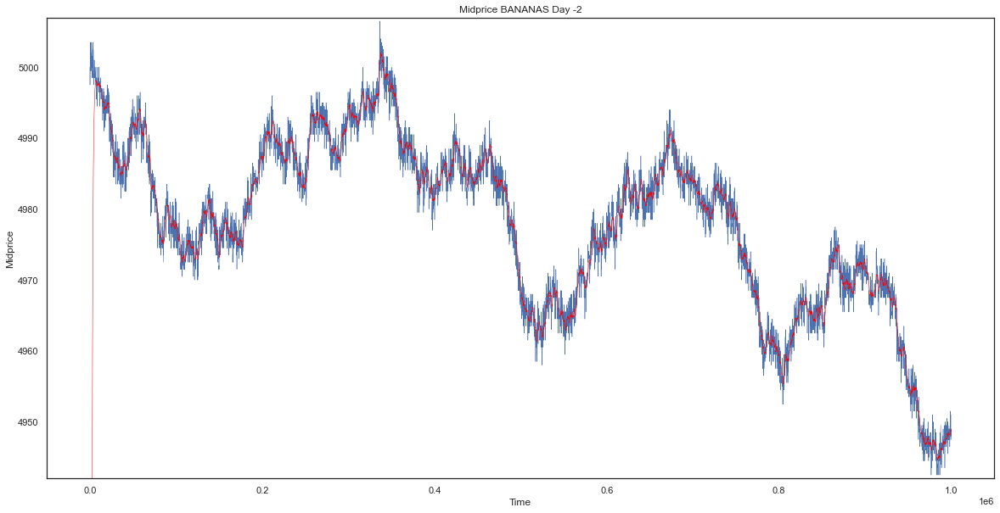

[1]
1


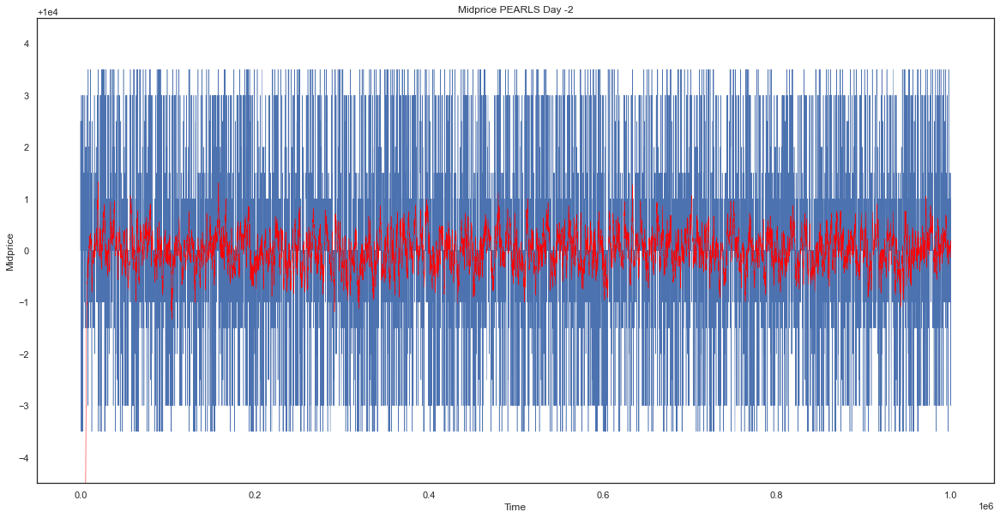

[1]
1


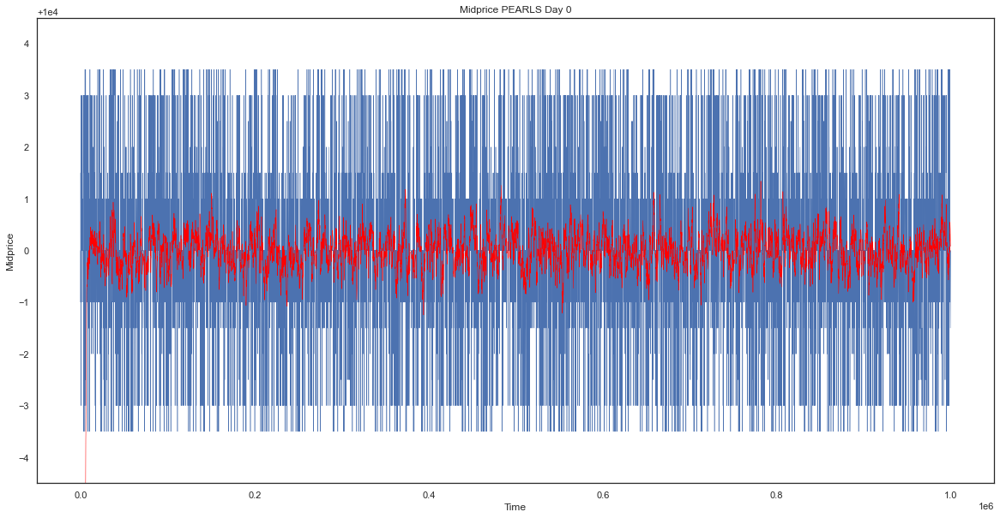

[1]
1


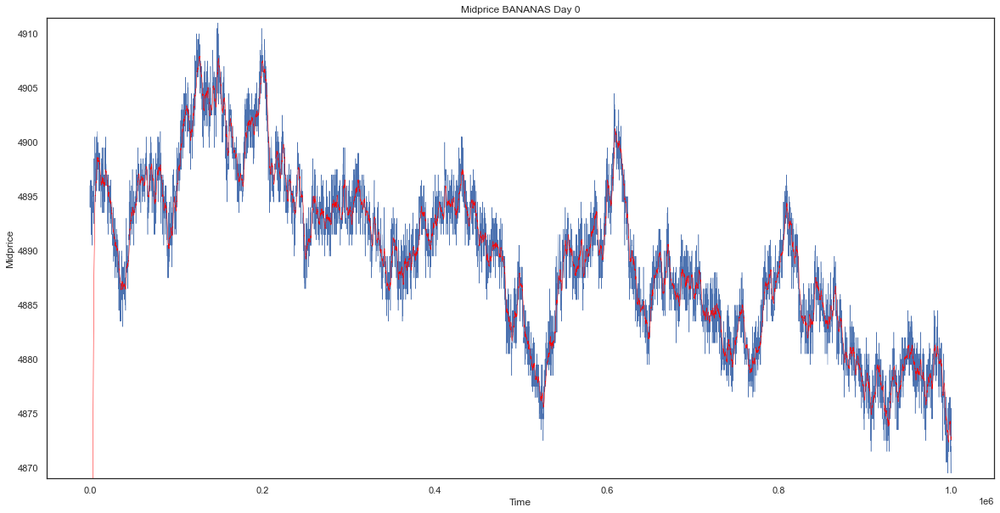

In [15]:
from pykalman import KalmanFilter
import numpy as np
kf = KalmanFilter(transition_matrices = [1],    # The value for At. It is a random walk so is set to 1.0
                  observation_matrices = [1],   # The value for Ht.
                  initial_state_mean = 0,       # Any initial value. It will converge to the true state value.
                  initial_state_covariance = 1, # Sigma value for the Qt in Equation (1) the Gaussian distribution
                  observation_covariance=1,     # Sigma value for the Rt in Equation (2) the Gaussian distribution
                  transition_covariance=.01)
for day, assets in output_dfs.items():
    for asset, data in assets.items():
        state_means, _ = kf.filter(data['mid_price'].values)
        print(kf.observation_matrices)
        print(kf.observation_covariance)
        # print(data['mid_price'].min() ,data['mid_price'].max())
        plt.ylim(0.9999*data['mid_price'].min(), 1.0001*data['mid_price'].max())
        data['KF_mean'] = np.array(state_means)
        plt.plot(data['timestamp'], data['mid_price'], label = asset, linewidth = 0.5)
        plt.plot(data['timestamp'], data['KF_mean'], label = asset, linewidth = 0.5, color = 'red')
        plt.xlabel('Time')
        plt.ylabel('Midprice')
        plt.title('Midprice ' + asset + " Day " + day)
        plt.show()

[[1.]]
[[35.5830648]]
[[13.91731341]]


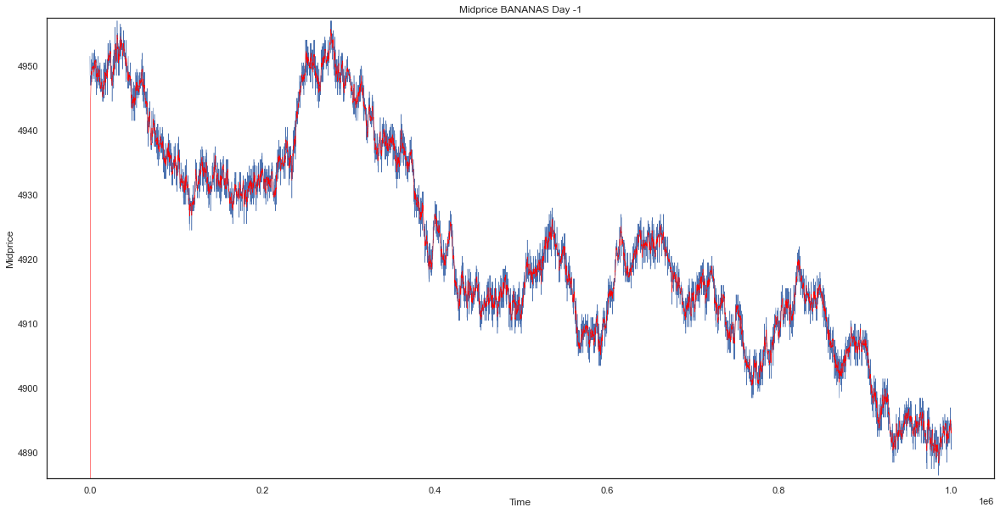

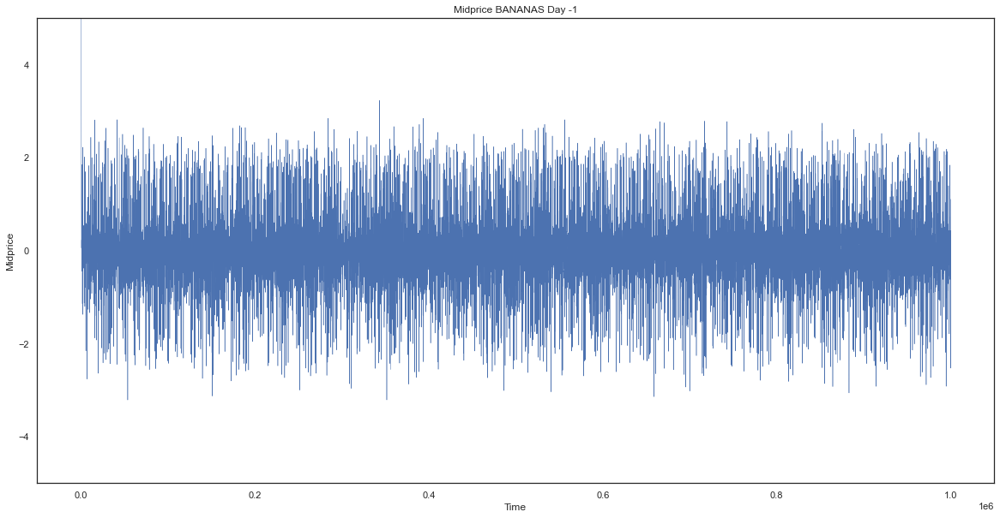

[[1.]]
[[35.77128783]]
[[14.29591922]]


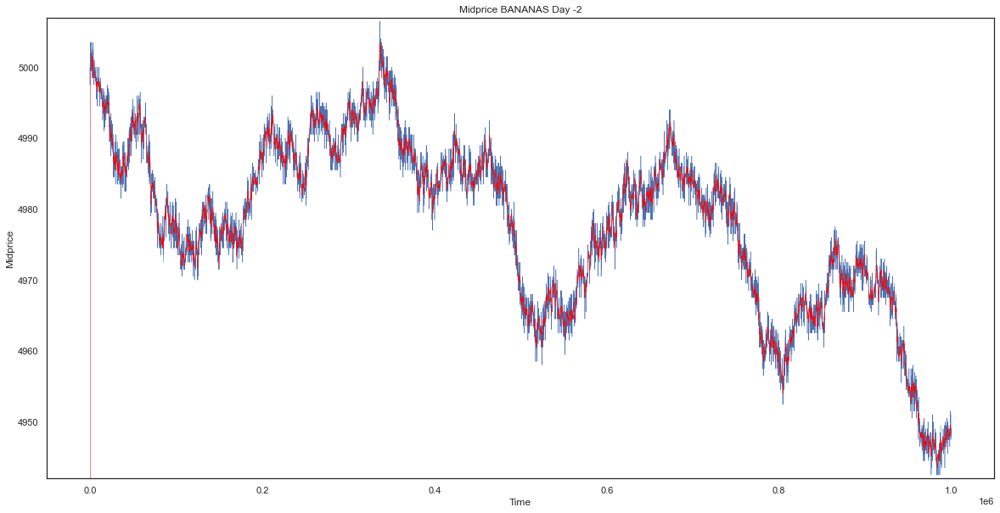

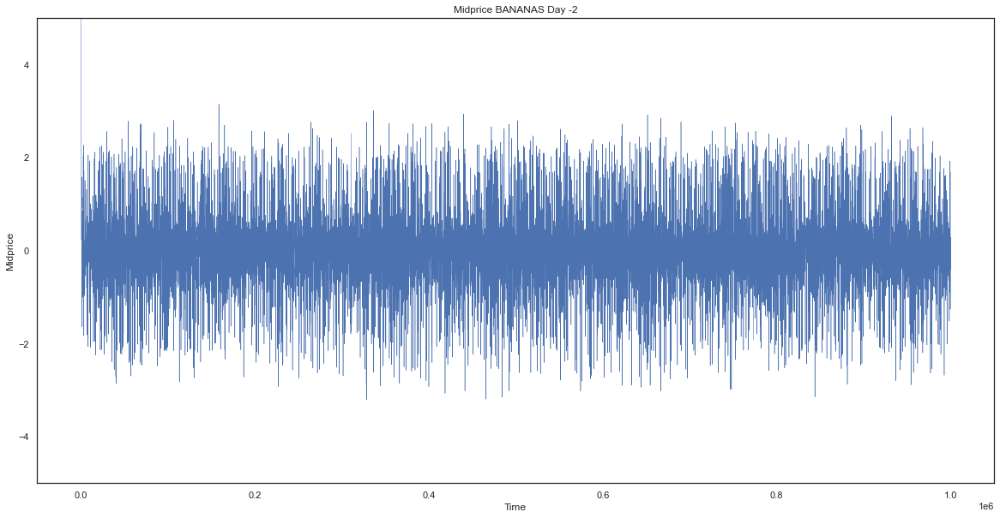

[[1.]]
[[34.48377189]]
[[13.645908]]


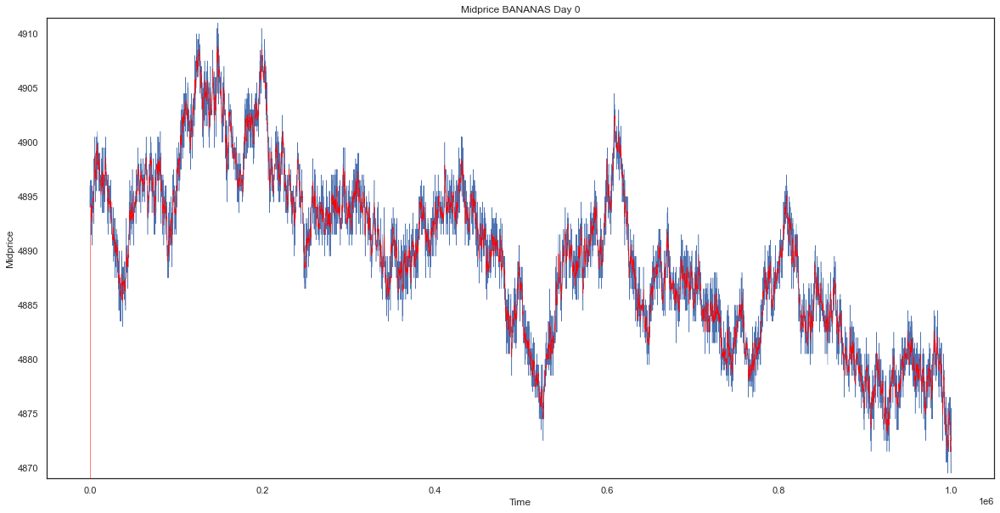

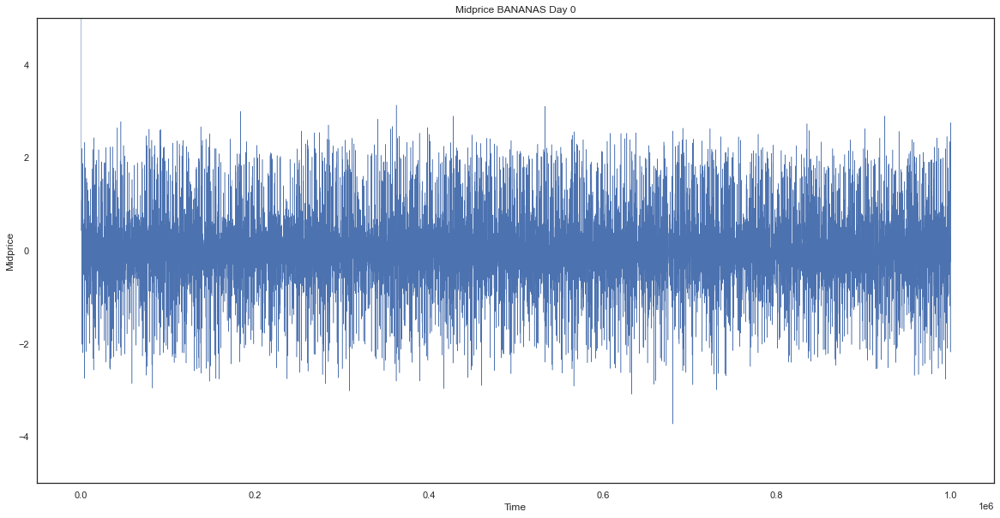

In [16]:
for day, assets in output_dfs.items():
    for asset, data in assets.items():
        if asset == 'BANANAS':
            kf = KalmanFilter(transition_matrices=np.array([[1]]),
                            transition_covariance=0.01 * np.eye(1))
            state_preds = states_pred = kf.em(data['mid_price']).smooth(data['mid_price'])[0]
            print(kf.observation_matrices)
            print(kf.observation_covariance)
            print(kf.transition_covariance)
            # print(data['mid_price'].min() ,data['mid_price'].max())
            plt.ylim(0.9999*data['mid_price'].min(), 1.0001*data['mid_price'].max())
            data['KF_mean'] = np.array(state_preds[:, 0])
            plt.plot(data['timestamp'], data['mid_price'], label = asset, linewidth = 0.5)
            plt.plot(data['timestamp'], data['KF_mean'], label = asset, linewidth = 0.5, color = 'red')
            plt.xlabel('Time')
            plt.ylabel('Midprice')
            plt.title('Midprice ' + asset + " Day " + day)
            plt.show()
            plt.ylim(-5, 5)
            plt.plot(data['timestamp'], data['mid_price']-data['KF_mean'], label = asset, linewidth = 0.5)
            plt.xlabel('Time')
            plt.ylabel('Midprice')
            plt.title('Midprice ' + asset + " Day " + day)
            plt.show()

In [17]:
def aroon(data, lb=25):
    df = data.copy()
    df['up'] = 100 * df['ask_price_1'].rolling(lb).apply(lambda x: x.argmax()) / lb
    df['dn'] = 100 * df['bid_price_1'].rolling(lb).apply(lambda x: x.argmin()) / lb
    return df['up'], df['dn']

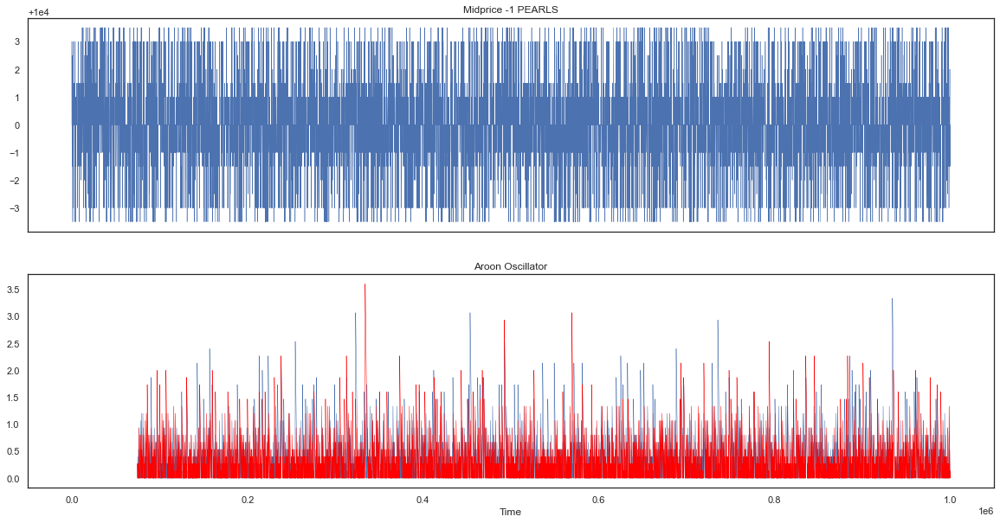

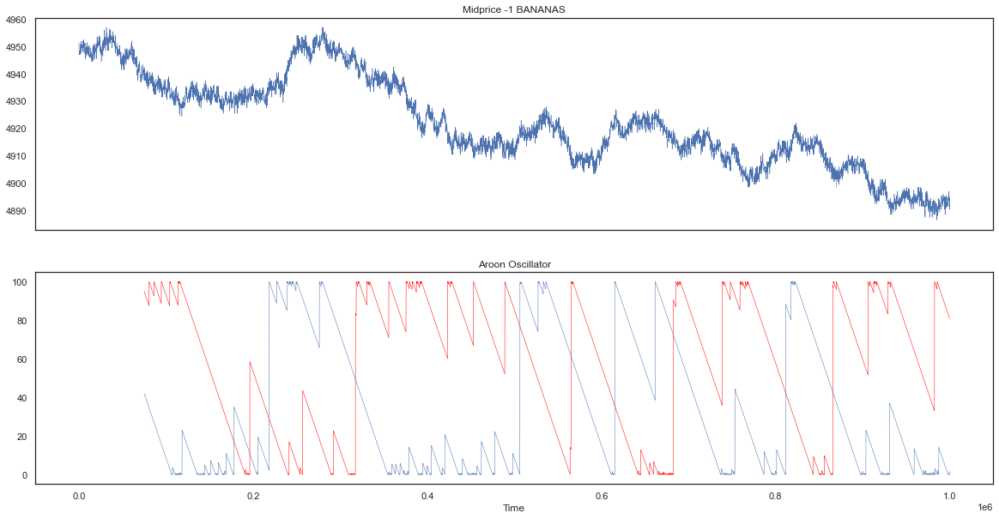

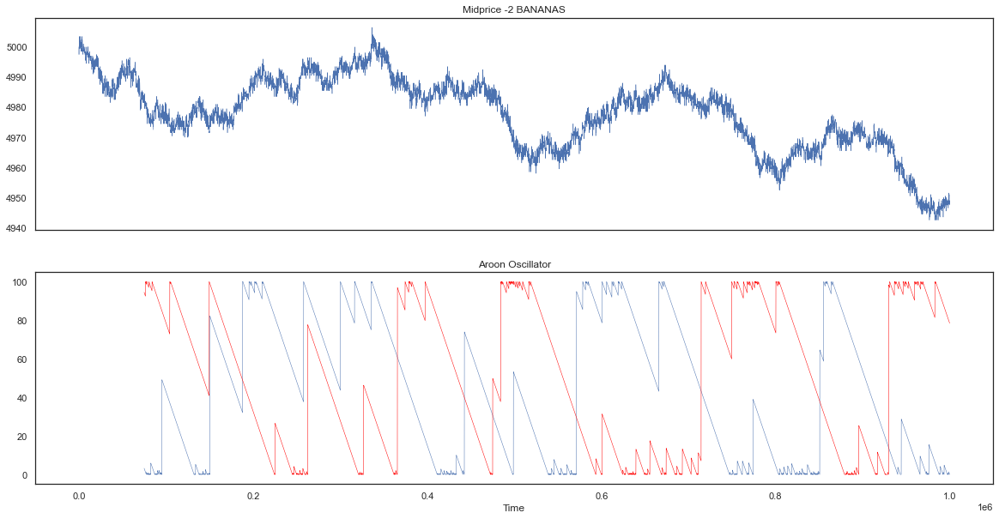

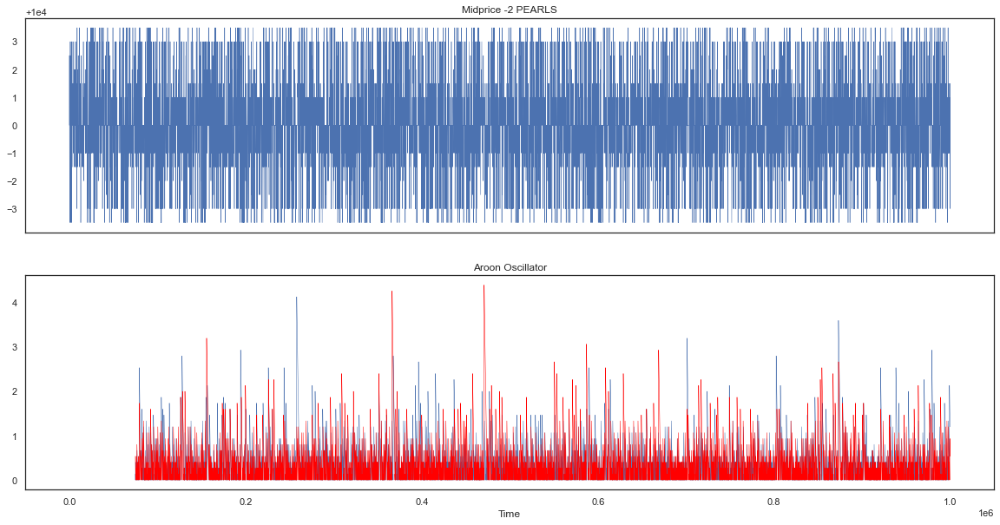

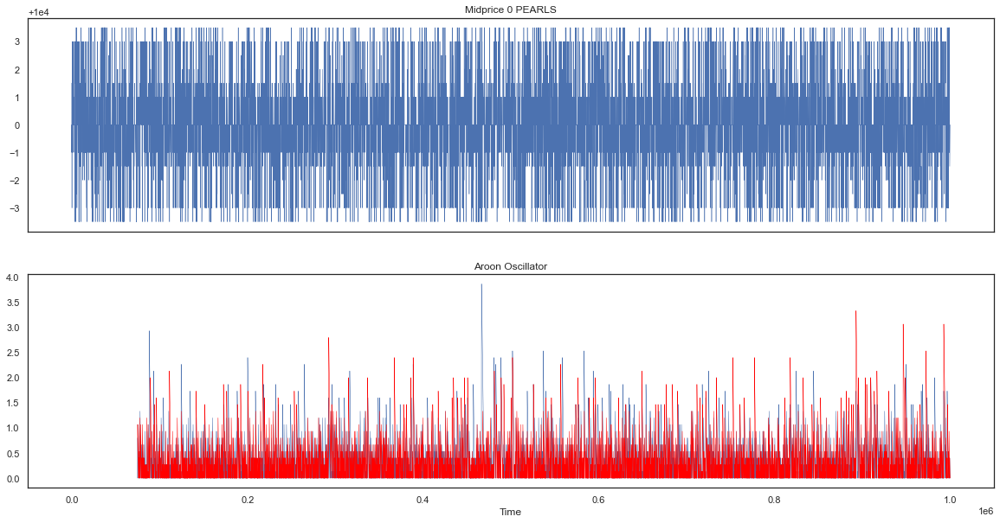

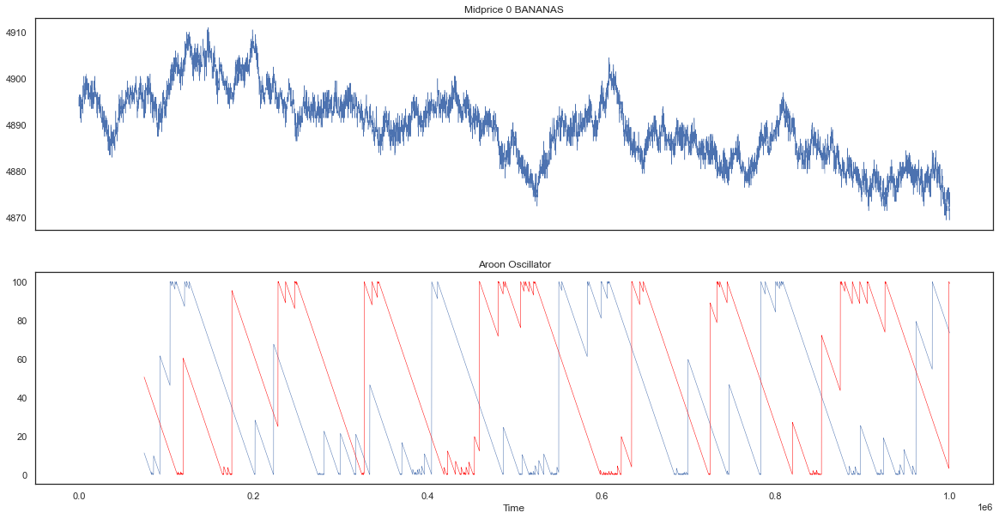

In [18]:
for day, assets in output_dfs.items():
    for asset, data in assets.items():
        data['aroon_up'], data['aroon_down'] = aroon(data, lb = 750)
        fig, axs = plt.subplots(2, sharex=True)
        axs[0].plot(data['timestamp'], data['mid_price'] , linewidth = 0.5)
        axs[0].title.set_text(str('Midprice '+ str(day)+ ' '+ asset))
        axs[1].plot(data['timestamp'], data['aroon_up'], label = 'Aroon Up', linewidth = 0.5)
        axs[1].plot(data['timestamp'], data['aroon_down'], label = 'Aroon Down', linewidth = 0.5, color = 'red')
        axs[1].title.set_text(str('Aroon Oscillator'))
        axs[1].set_xlabel('Time')
        plt.show()

0.00033991778127314906


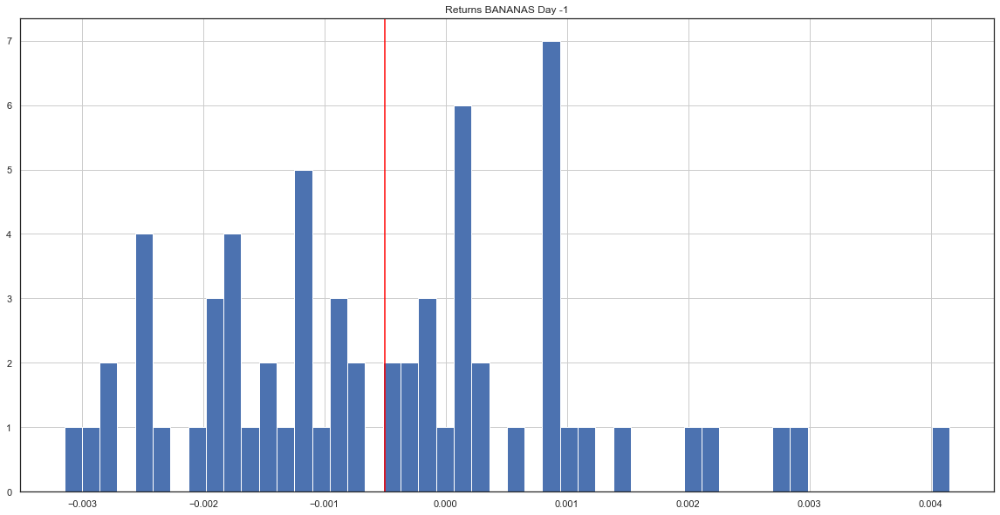

0.00034052424886918625


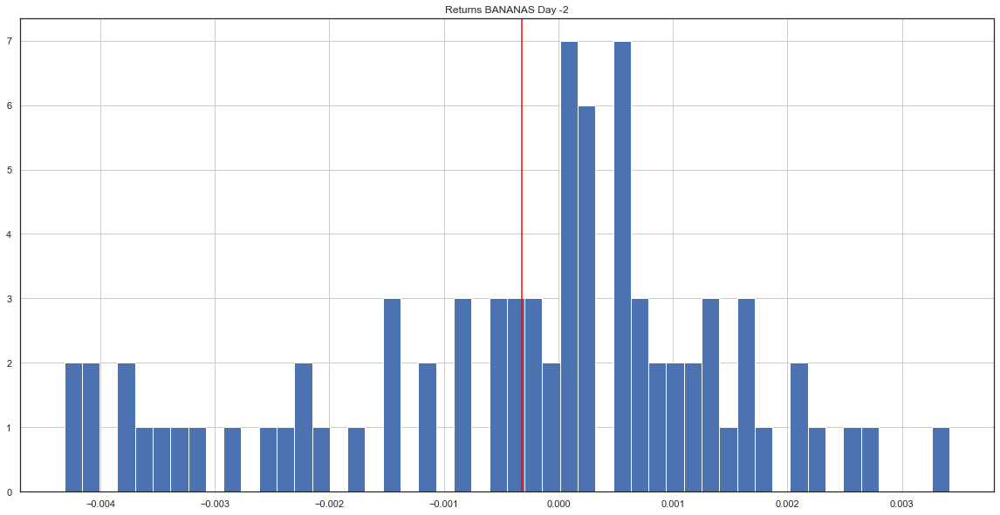

0.00033752980371172216


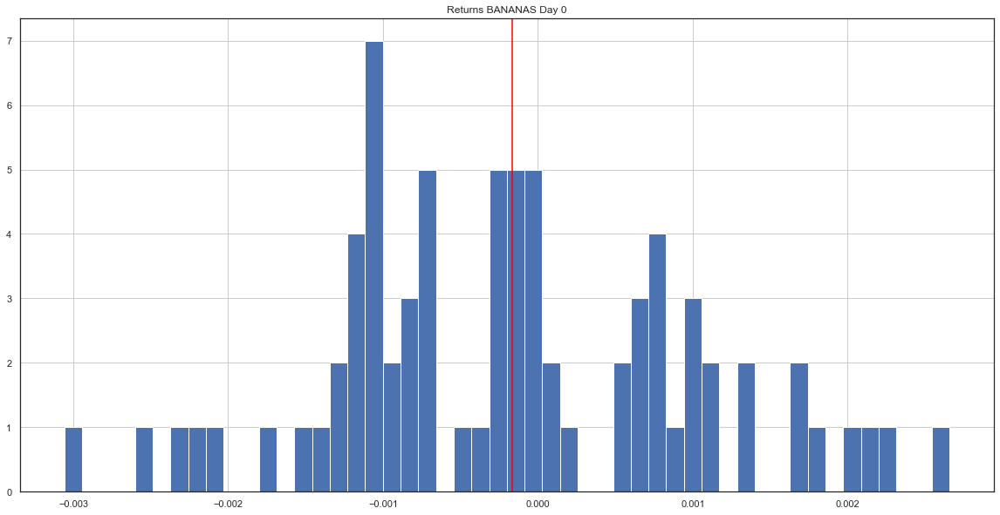

In [19]:
for day, assets in output_dfs.items():
    for asset, data in assets.items():
        if asset == 'BANANAS':
            data['pct_change'] = data['mid_price'].pct_change()
            print(data['pct_change'].std())
            filtered_data = data[data['pct_change']>0.0009]['mid_price'].pct_change(periods = 3)
            filtered_data.hist(bins = 50)
            plt.title('Returns ' + asset + " Day " + day)
            plt.axvline(filtered_data.mean(), color = 'red')
            plt.show()

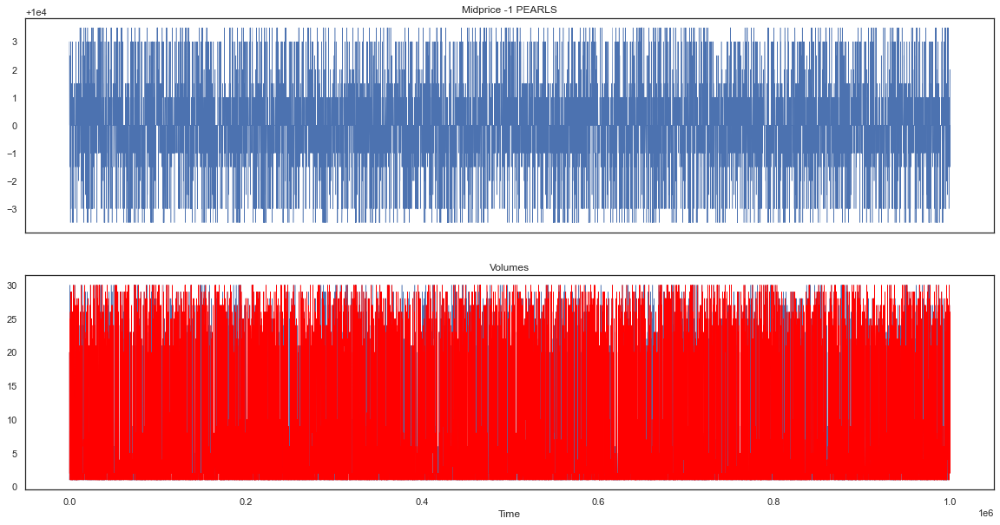

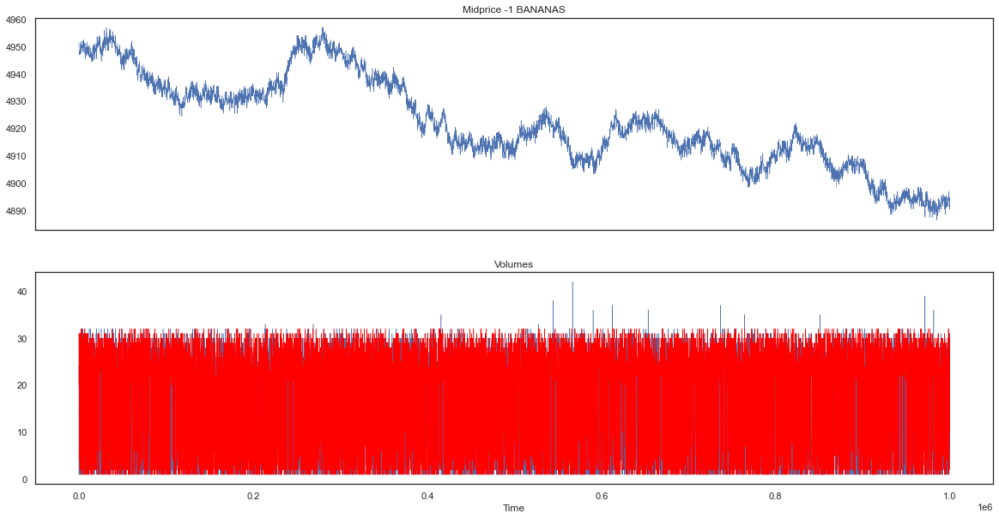

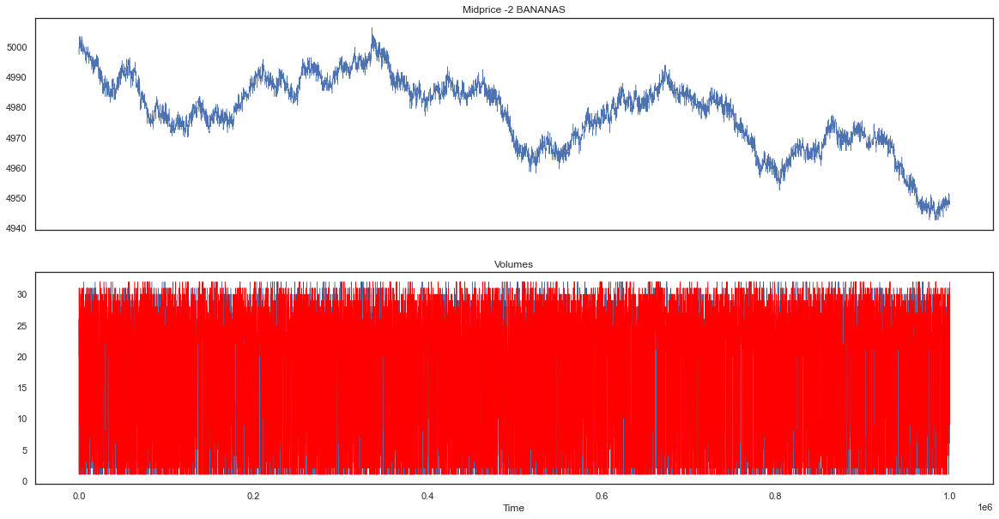

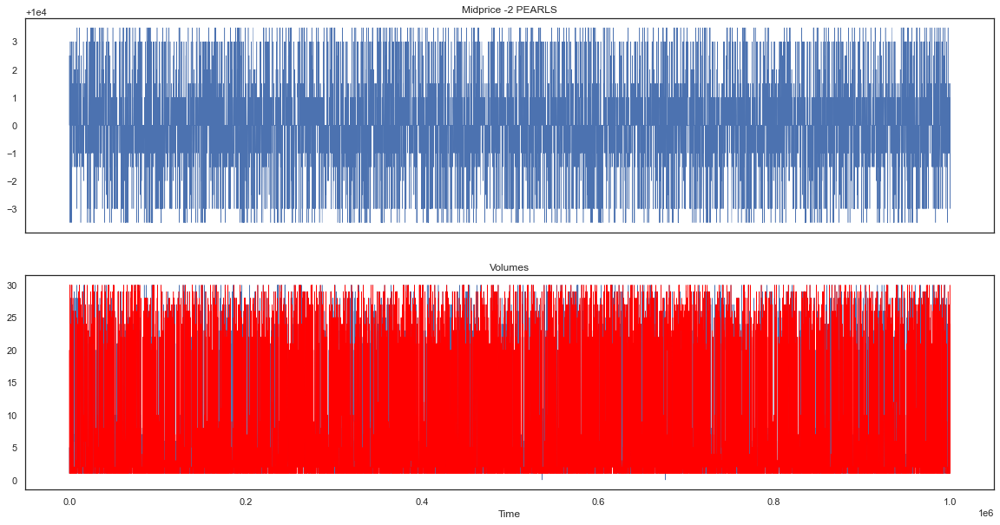

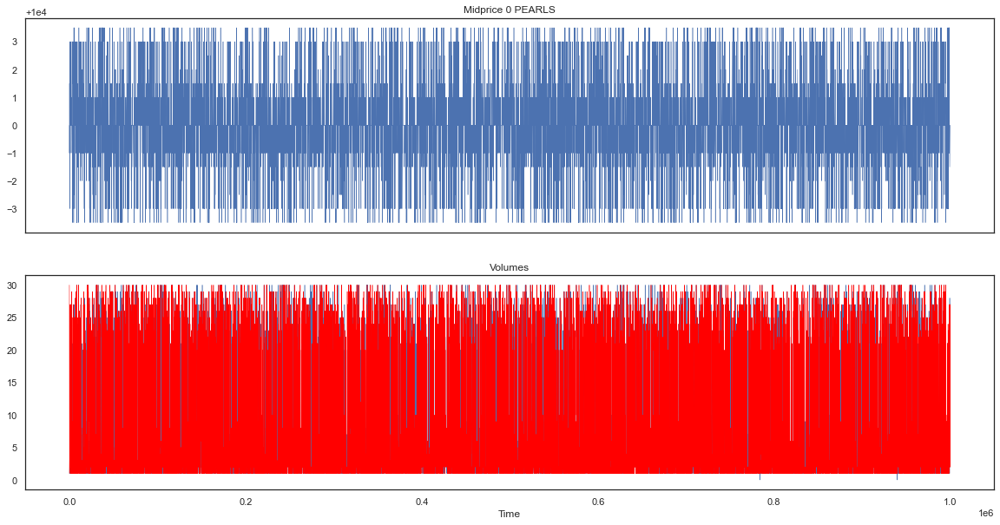

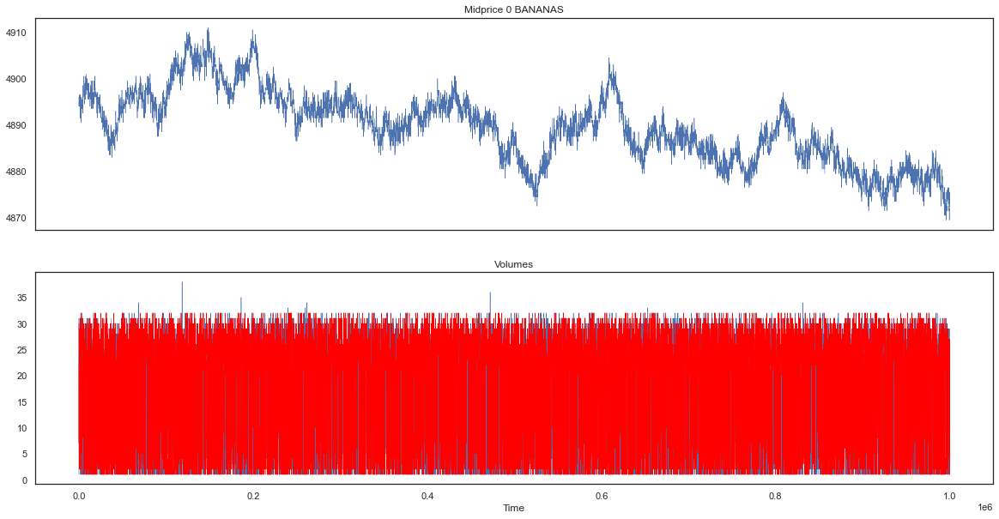

In [20]:
for day, assets in output_dfs.items():
    for asset, data in assets.items():
        fig, axs = plt.subplots(2, sharex=True)
        axs[0].plot(data['timestamp'], data['mid_price'] , linewidth = 0.5)
        axs[0].title.set_text(str('Midprice '+ str(day)+ ' '+ asset))
        axs[1].plot(data['timestamp'], data['bid_volume_1'], label = 'Aroon Up', linewidth = 0.5)
        axs[1].plot(data['timestamp'], data['ask_volume_1'], label = 'Aroon Down', linewidth = 0.5, color = 'red')
        axs[1].title.set_text(str('Volumes'))
        axs[1].set_xlabel('Time')
        plt.show()

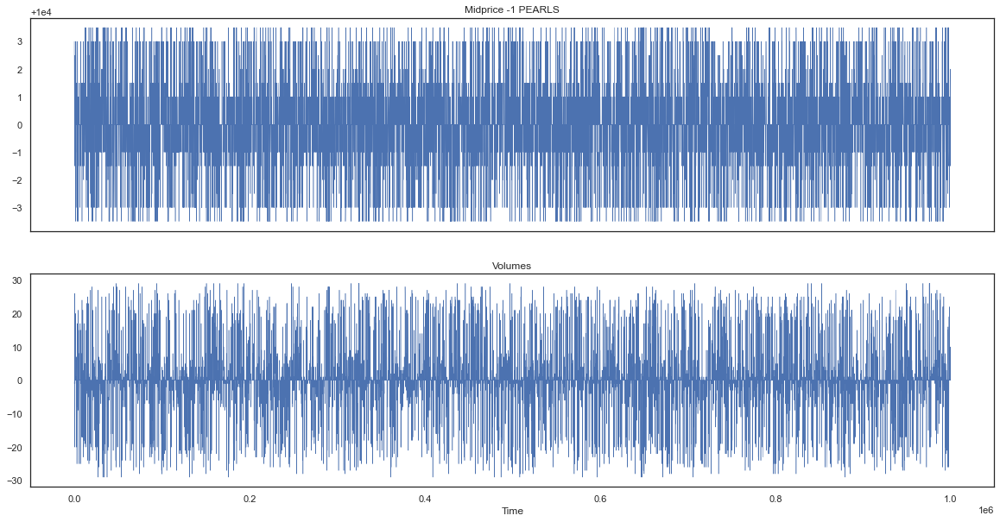

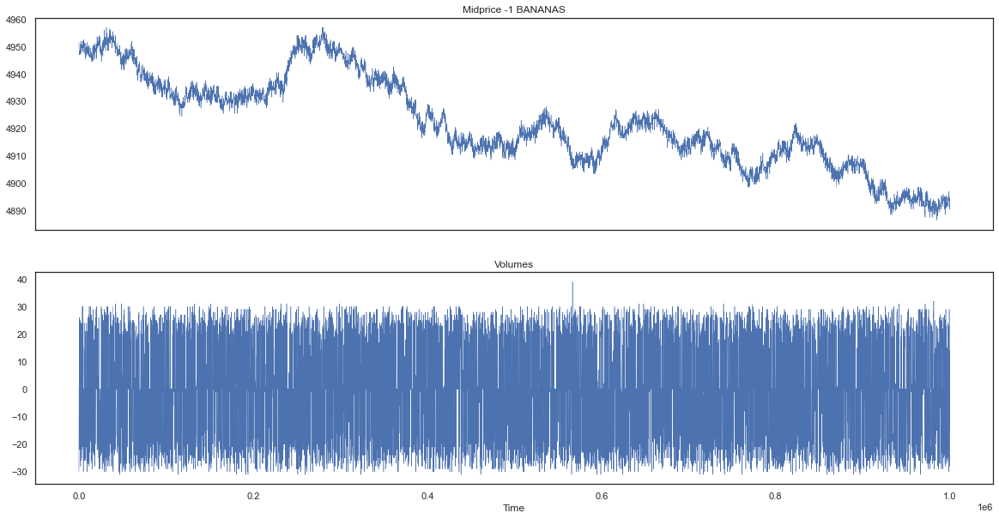

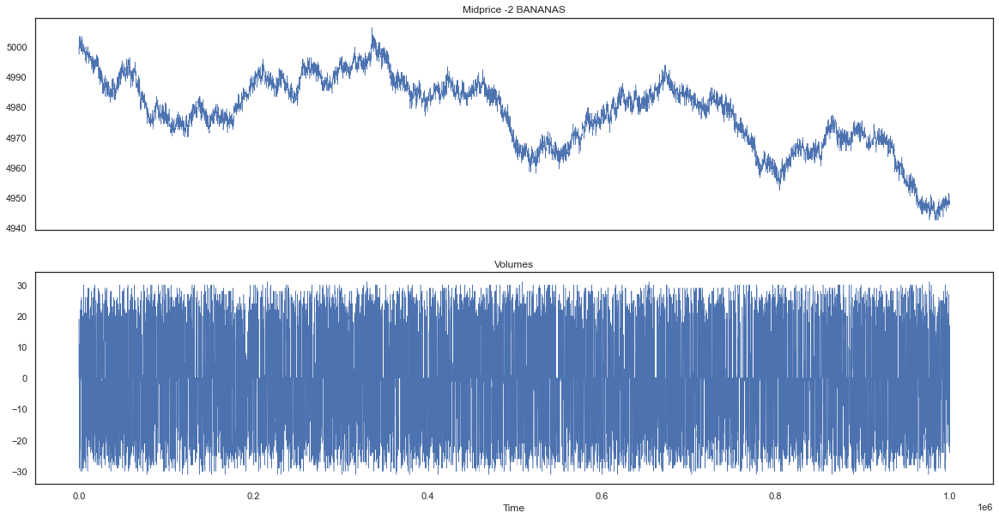

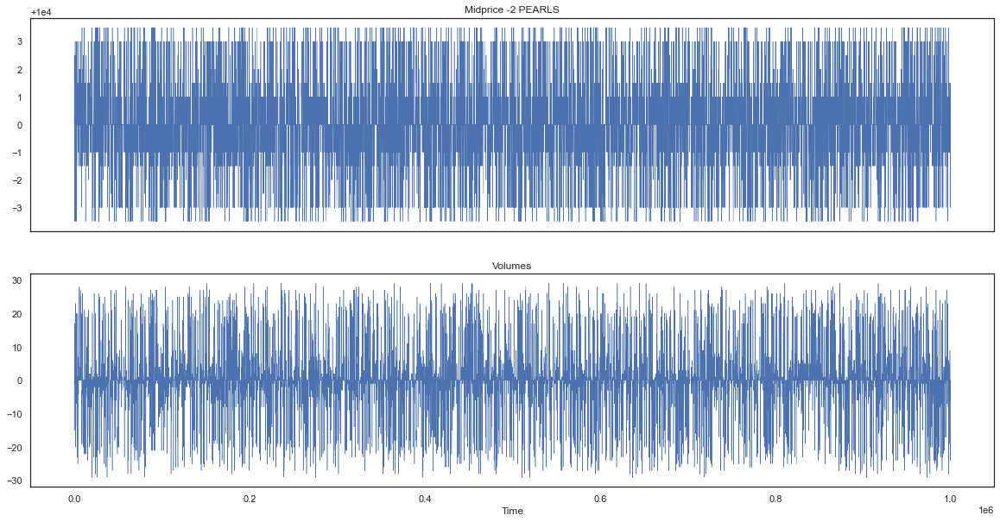

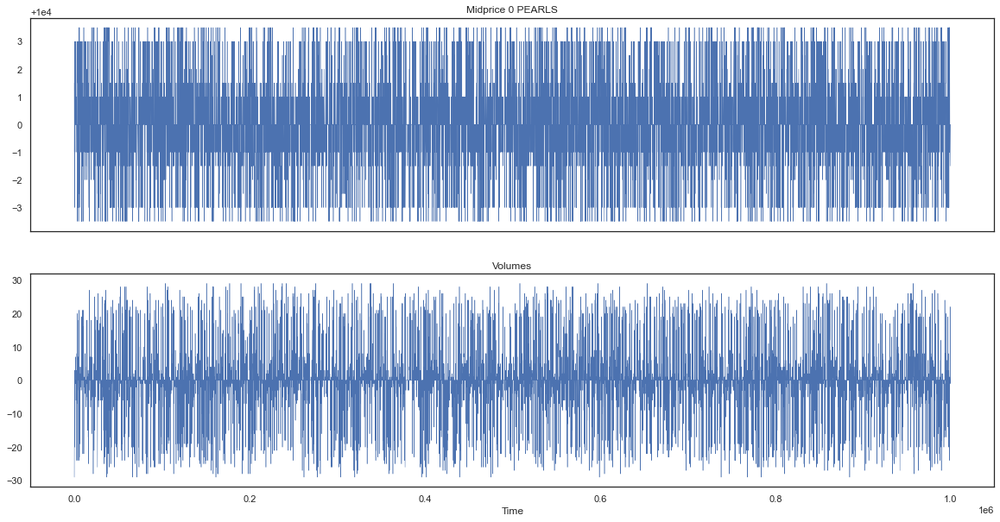

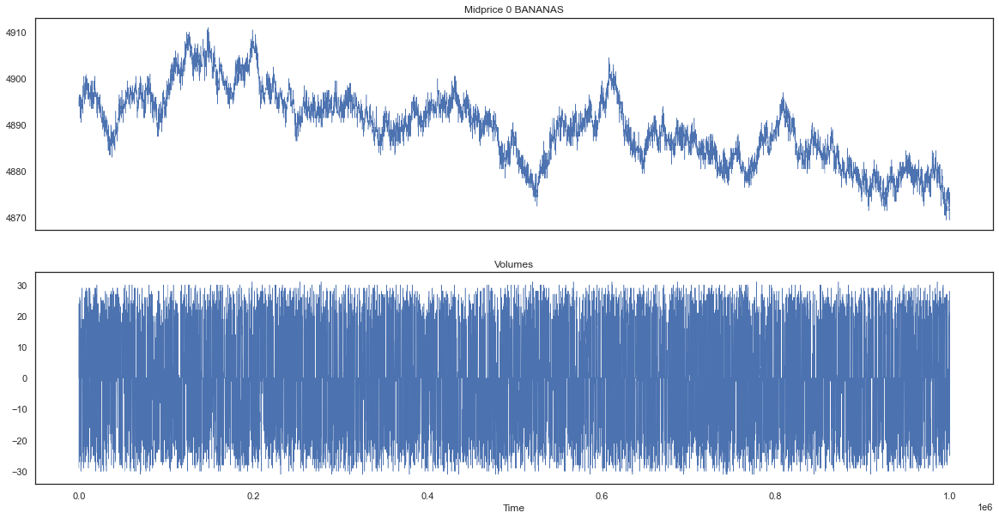

In [21]:
for day, assets in output_dfs.items():
    for asset, data in assets.items():
        fig, axs = plt.subplots(2, sharex=True)
        axs[0].plot(data['timestamp'], data['mid_price'] , linewidth = 0.5)
        axs[0].title.set_text(str('Midprice '+ str(day)+ ' '+ asset))
        axs[1].plot(data['timestamp'], data['bid_volume_1']-data['ask_volume_1'], label = 'Aroon Up', linewidth = 0.5)
        # axs[1].plot(data['timestamp'], data['ask_volume_1'], label = 'Aroon Down', linewidth = 0.5, color = 'red')
        axs[1].title.set_text(str('Volumes'))
        axs[1].set_xlabel('Time')
        plt.show()

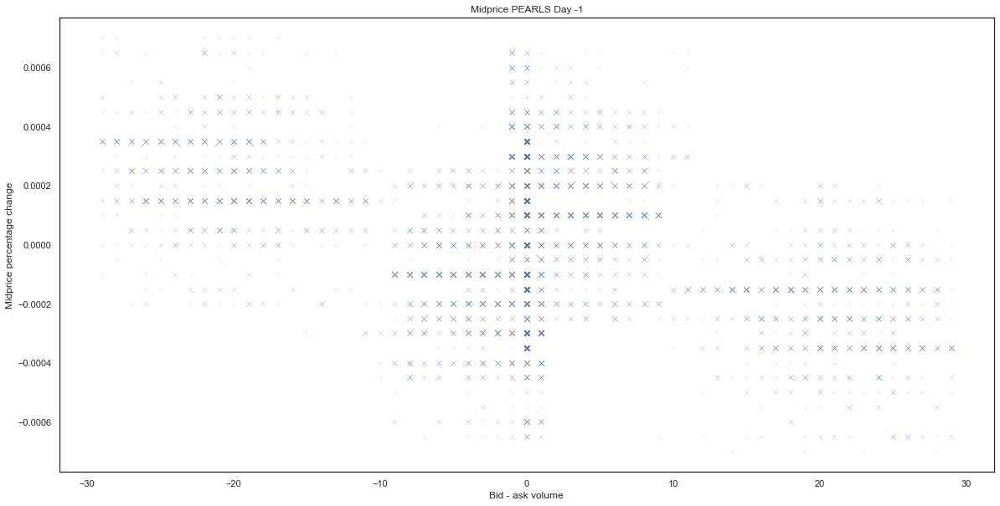

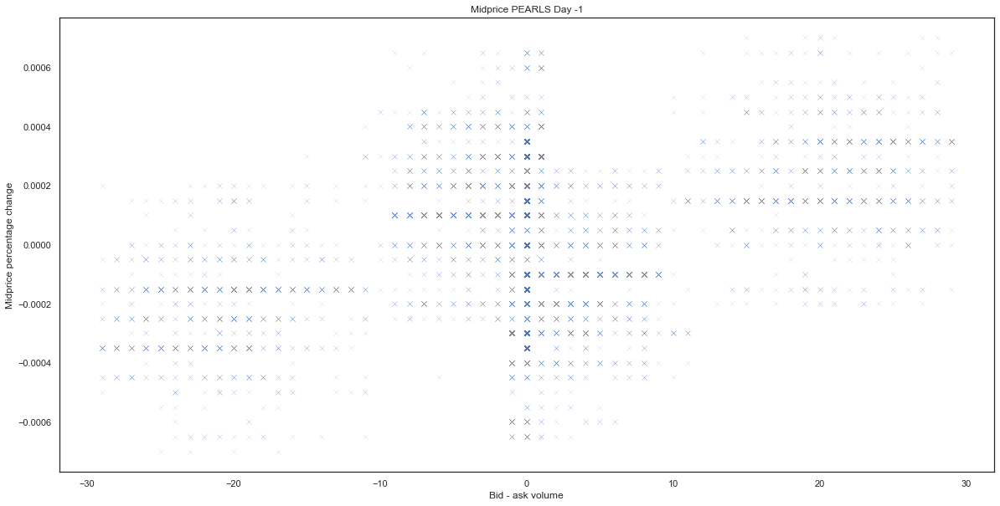

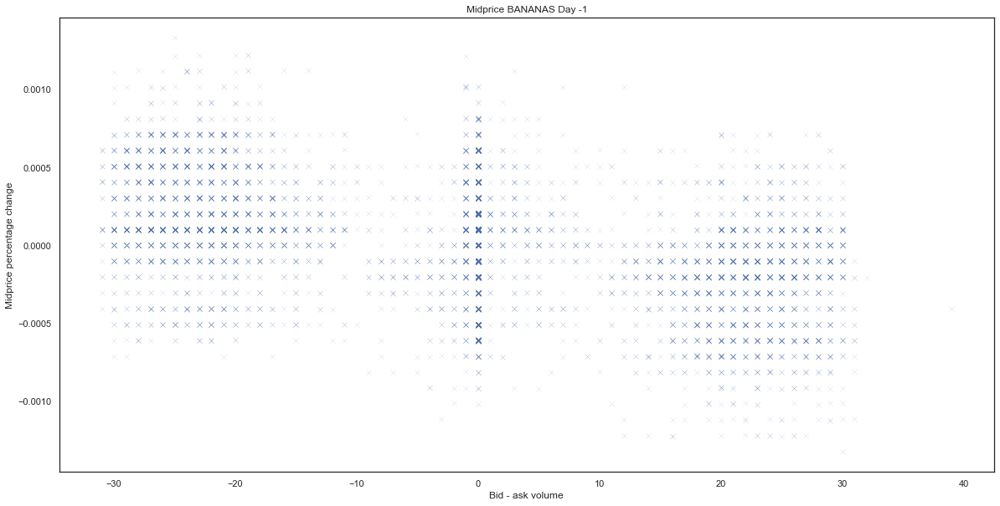

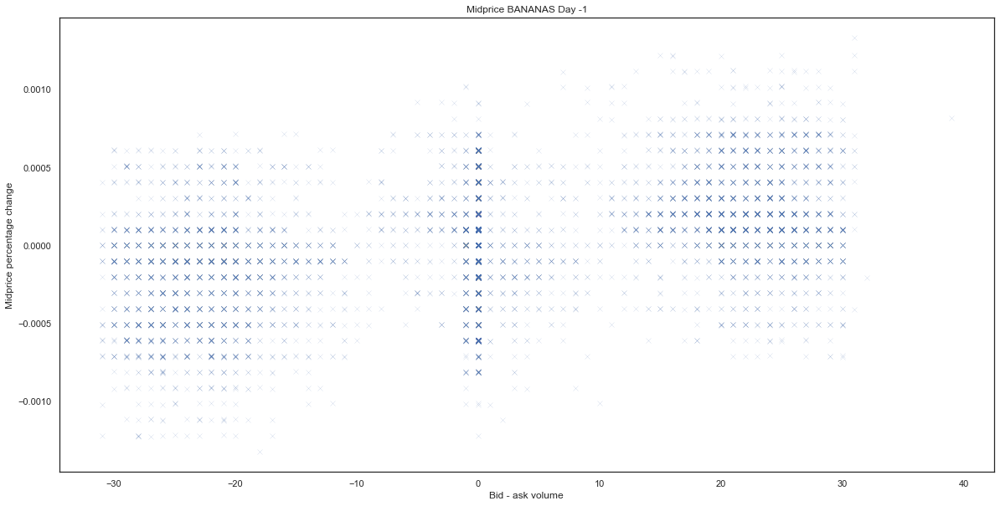

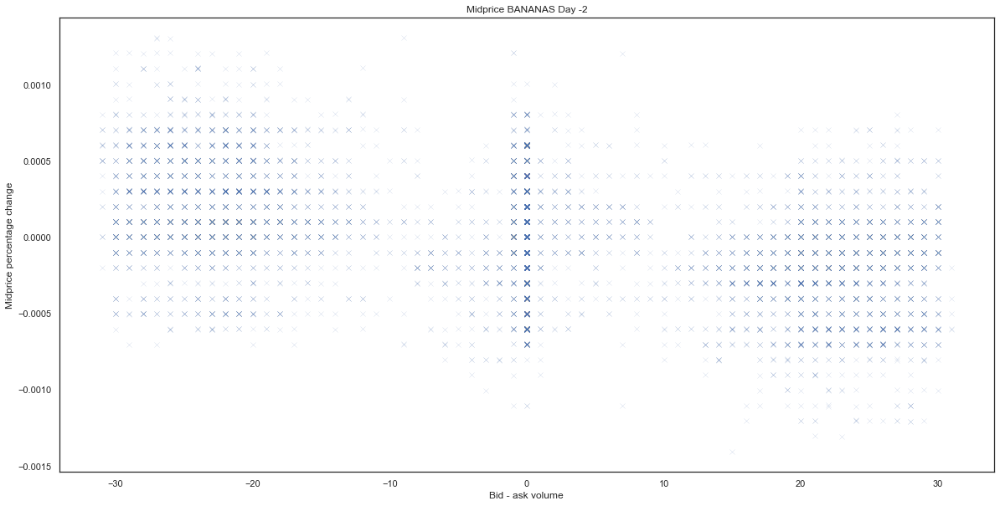

...

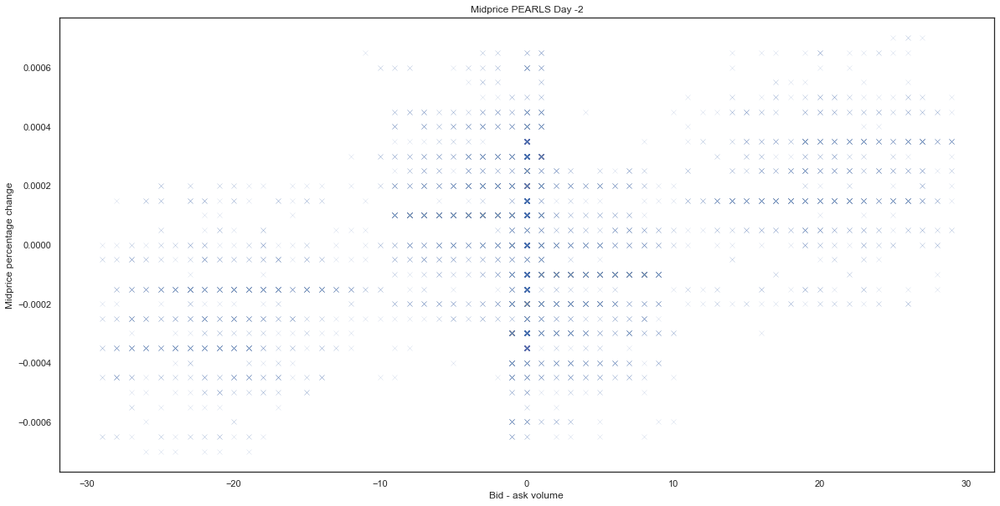

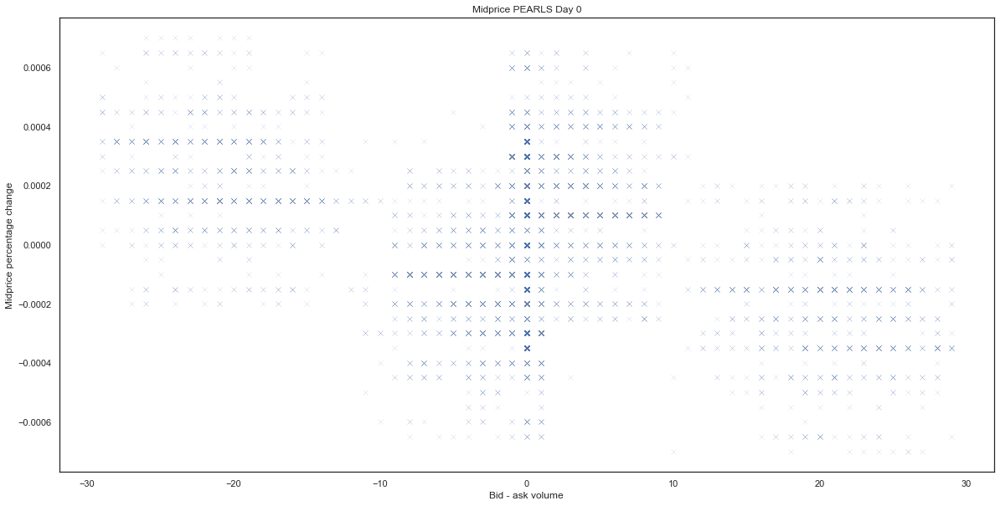

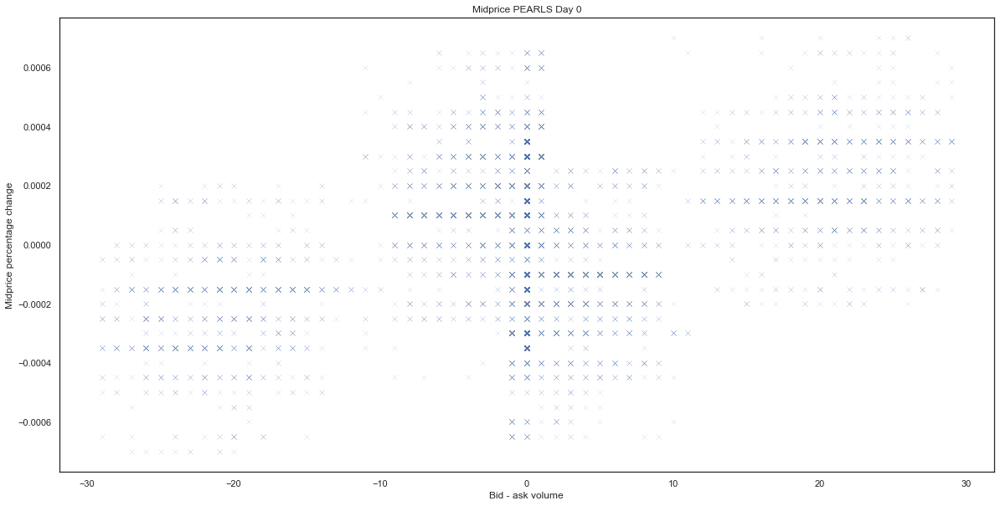

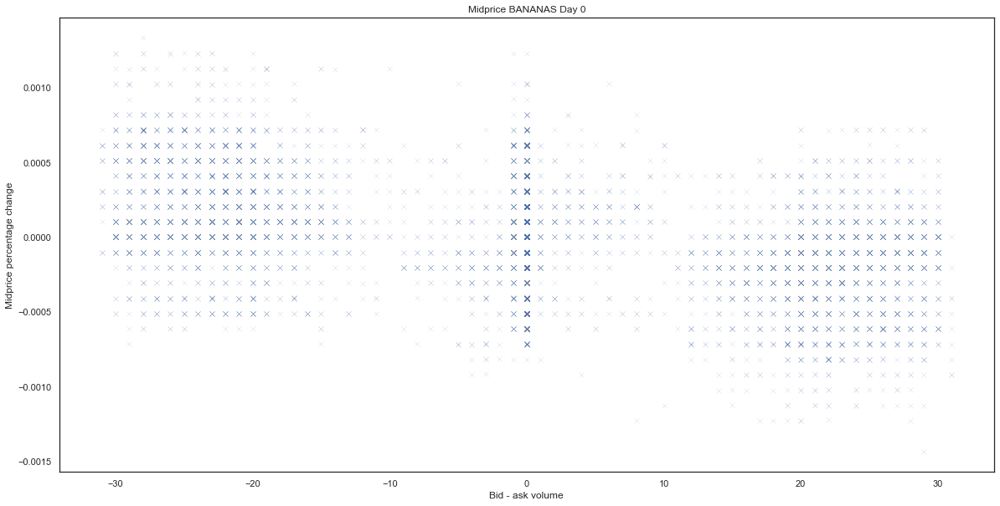

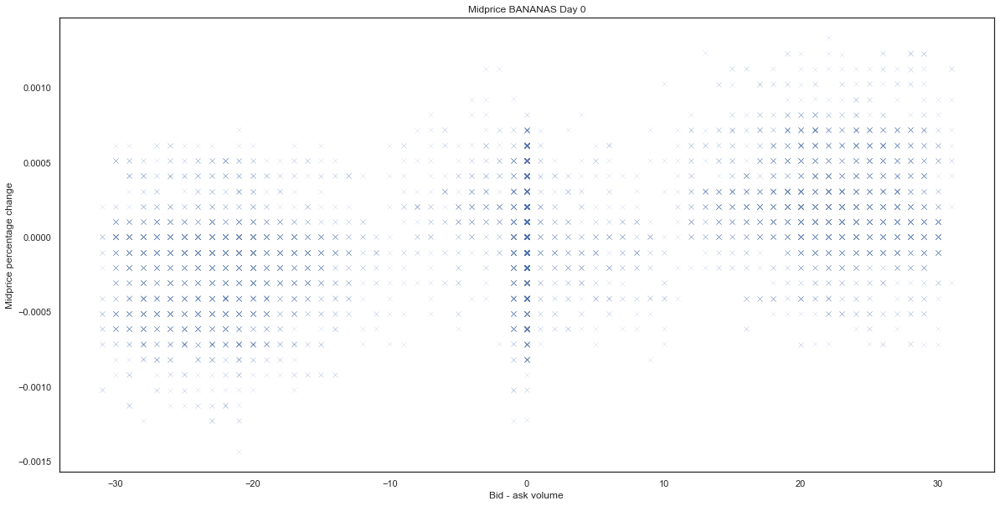

In [22]:
for day, assets in output_dfs.items():
    for asset, data in assets.items():
        plt.scatter((data['bid_volume_1']-data['ask_volume_1']), data['mid_price'].pct_change(), marker = 'x',linewidths=0.1)
        plt.xlabel('Bid - ask volume')
        plt.ylabel('Midprice percentage change')
        plt.title('Midprice ' + asset + " Day " + day)
        plt.show()
        plt.scatter((data['bid_volume_1']-data['ask_volume_1'])[0:-1], data['mid_price'].pct_change()[1:], marker = 'x',linewidths=0.1)
        plt.xlabel('Bid - ask volume')
        plt.ylabel('Midprice percentage change')
        plt.title('Midprice ' + asset + " Day " + day)
        plt.show()
        plt.show()

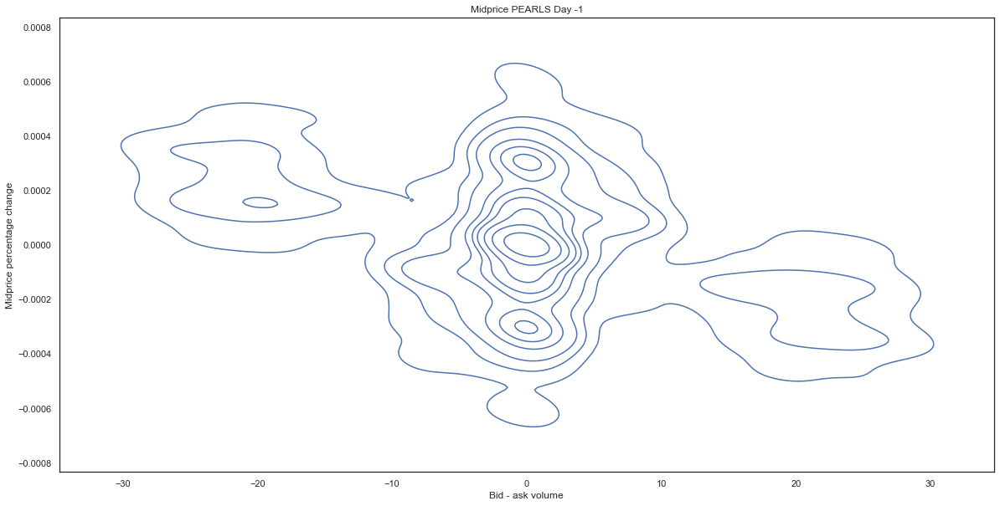

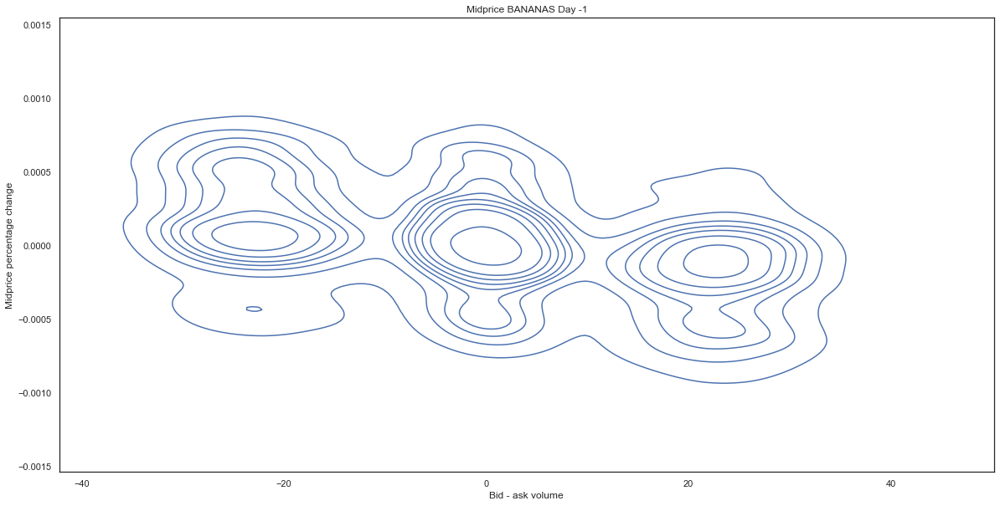

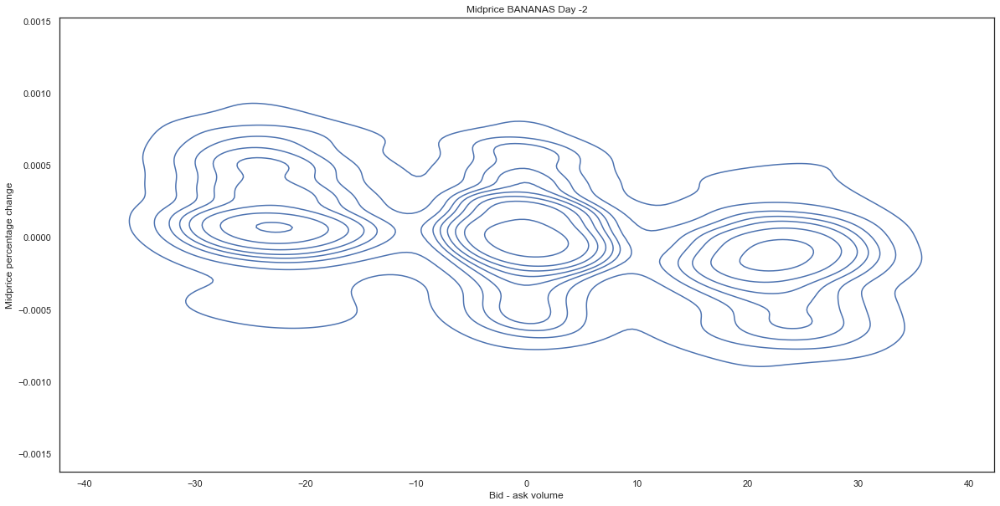

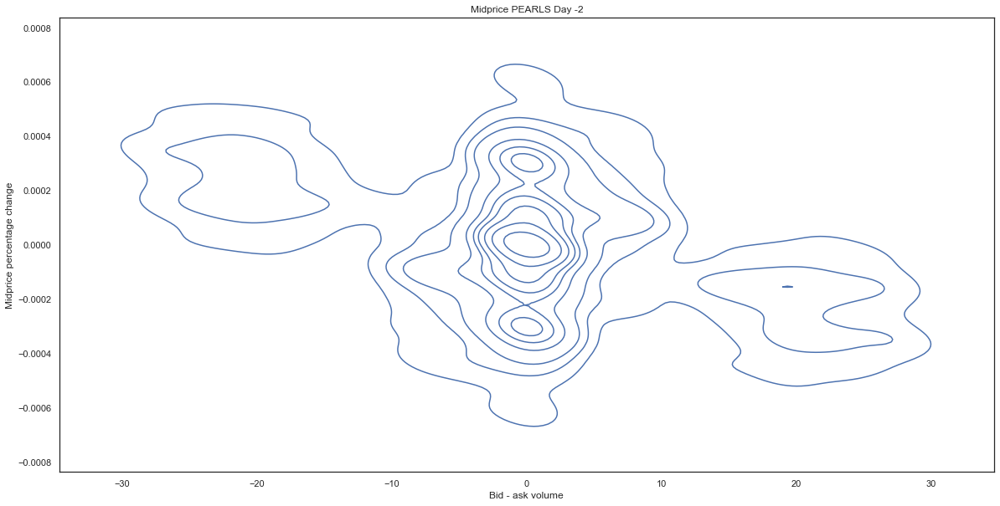

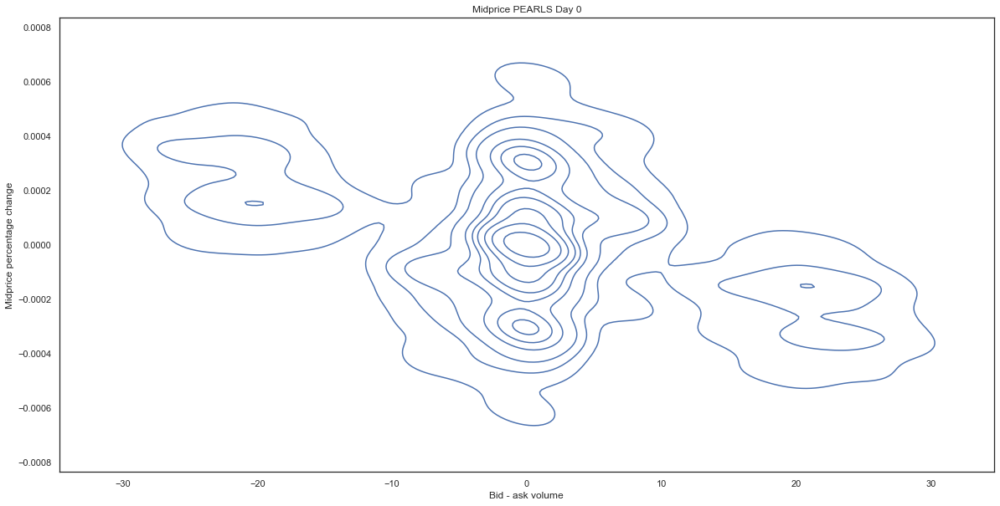

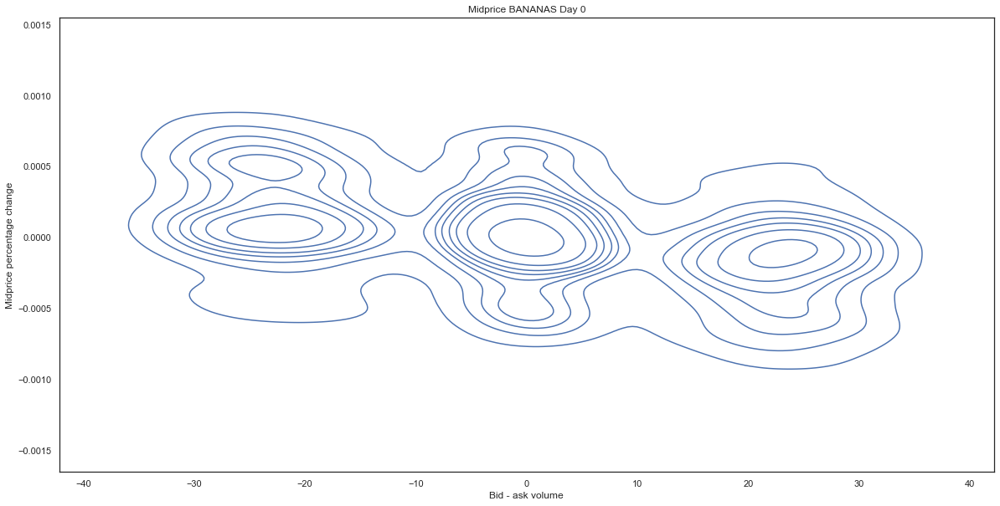

In [39]:
for day, assets in output_dfs.items():
    for asset, data in assets.items():
        sns.kdeplot(x = (data['bid_volume_1']-data['ask_volume_1'])[0:-1],y = data['mid_price'].pct_change()[1:])
        plt.xlabel('Bid - ask volume')
        plt.ylabel('Midprice percentage change')
        plt.title('Midprice ' + asset + " Day " + day)
        plt.show()

In [40]:
def calc_rsi(over: pd.Series, fn_roll, window) -> pd.Series:
    """Function to calculate RSI"""
    # Get the difference in price from previous step
    delta = over.diff()
    # Get rid of the first row, which is NaN since it did not have a previous row to calculate the differences
    delta = delta[1:]

    # Make the positive gains (up) and negative gains (down) Series
    up, down = delta.clip(lower=0), delta.clip(upper=0).abs()

    roll_up, roll_down = fn_roll(up), fn_roll(down)
    rs = roll_up / roll_down
    rsi = 100.0 - (100.0 / (1.0 + rs))

    # Avoid division-by-zero if `roll_down` is zero
    # This prevents inf and/or nan values.
    rsi[:] = np.select([roll_down == 0, roll_up == 0, True], [100, 0, rsi])
    rsi.name = 'rsi'

    # Assert range
    valid_rsi = rsi[window - 1:]
    assert ((0 <= valid_rsi) & (valid_rsi <= 100)).all()
    # Note: rsi[:length - 1] is excluded from above assertion because it is NaN for SMA.

    return rsi

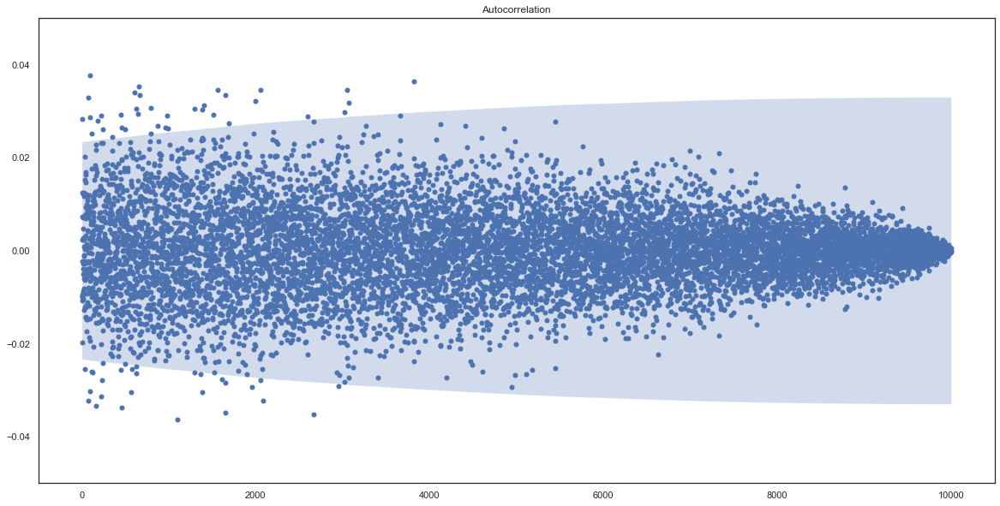

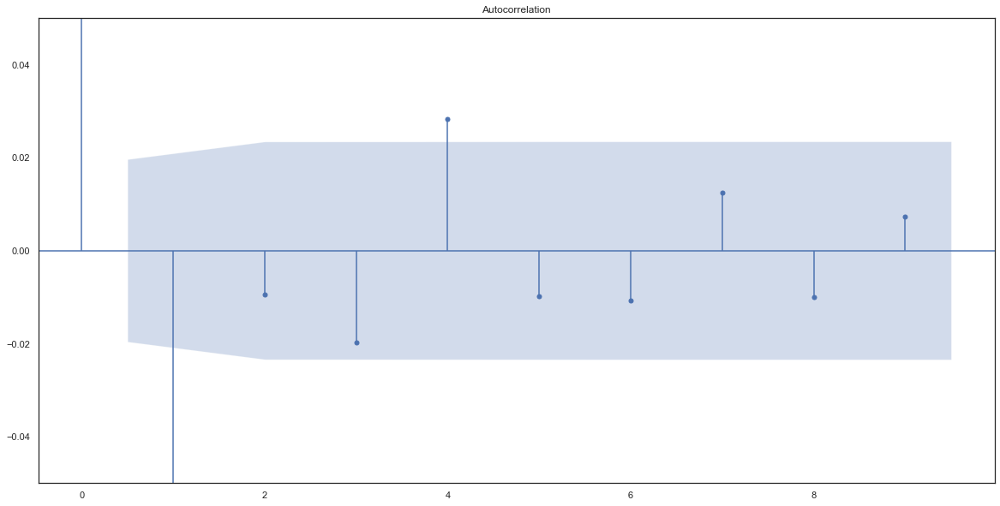

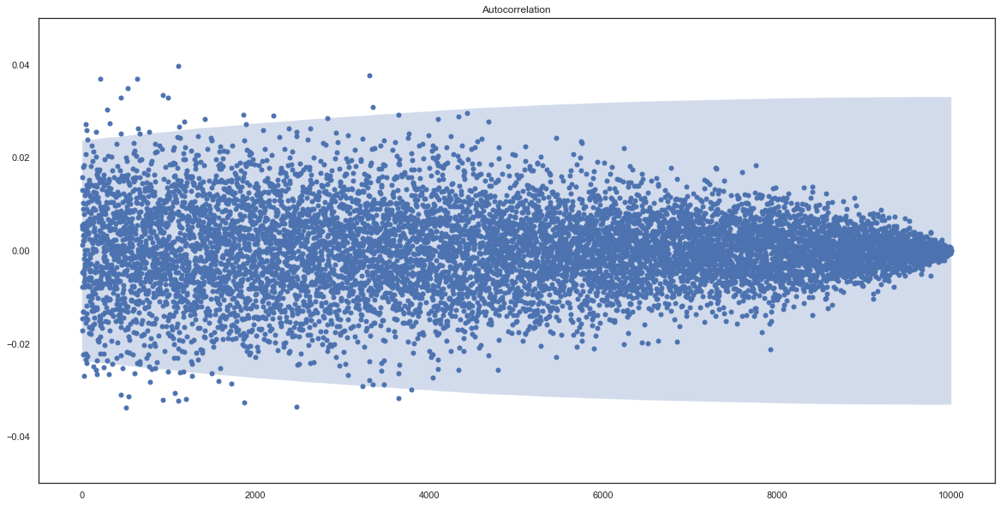

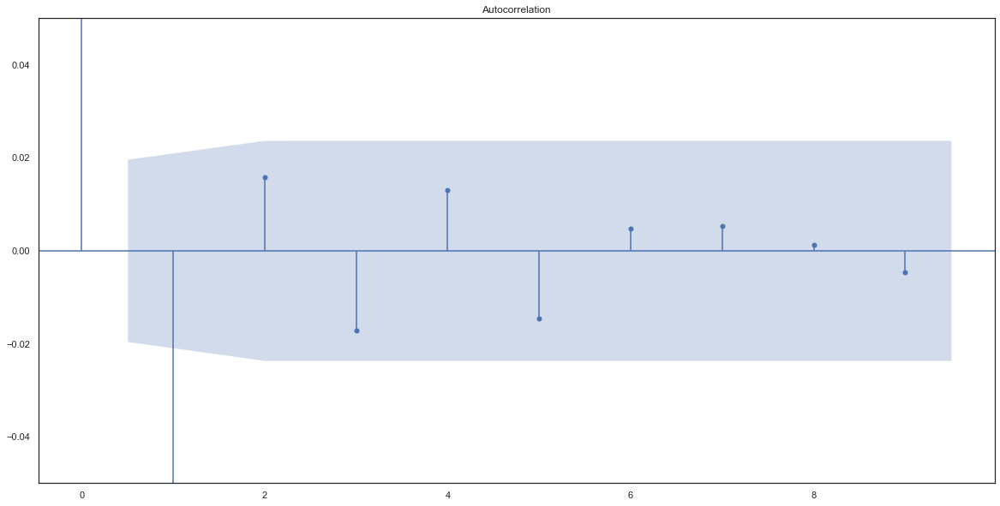

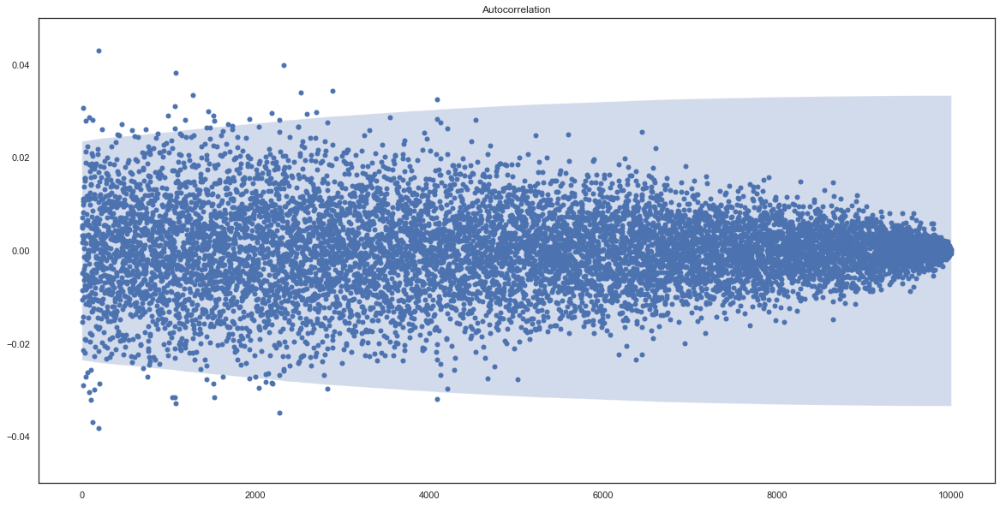

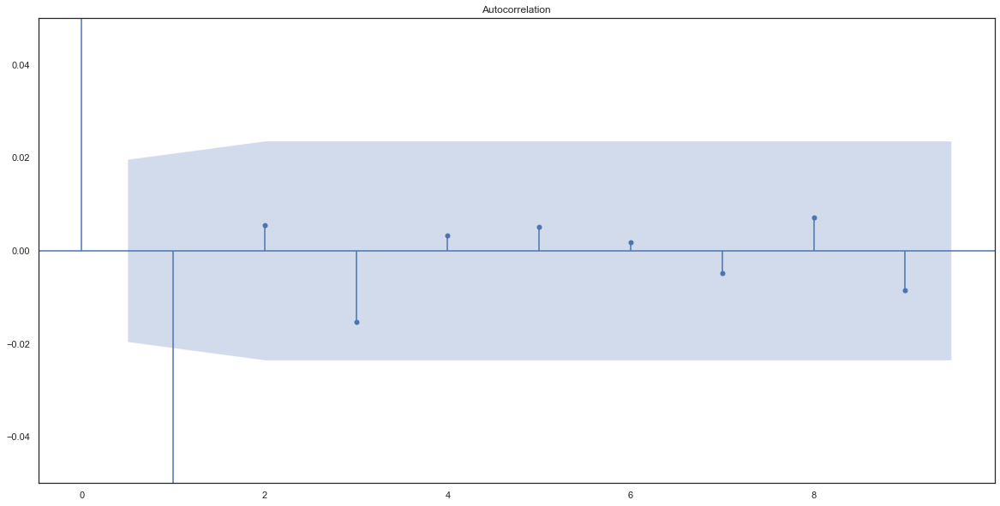

In [41]:
from statsmodels.graphics.tsaplots import plot_acf
for day, assets in output_dfs.items():
    for asset, data in assets.items():
        if asset == 'BANANAS':
            changes = data['mid_price'].pct_change()[1:]
            plot_acf(changes, lags = np.arange(9999),use_vlines = False)
            plt.ylim(-0.05, 0.05)
            plt.show()
            plot_acf(changes, lags = np.arange(10),use_vlines = True)
            plt.ylim(-0.05, 0.05)
            plt.show()

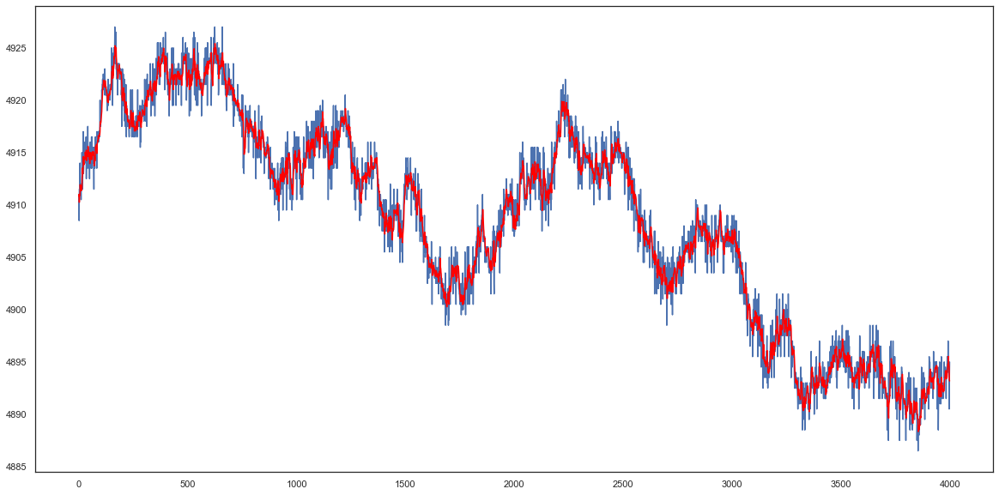

Test RMSE: 1.349


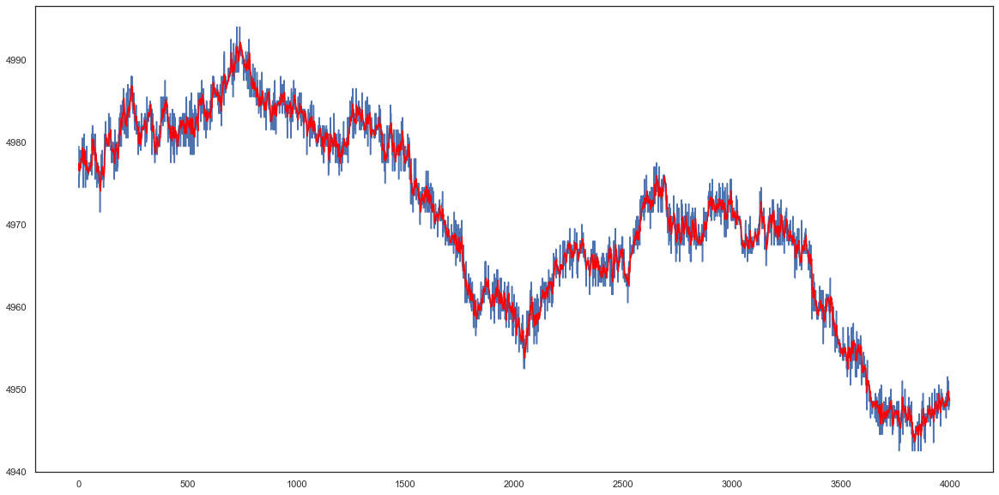

Test RMSE: 1.381


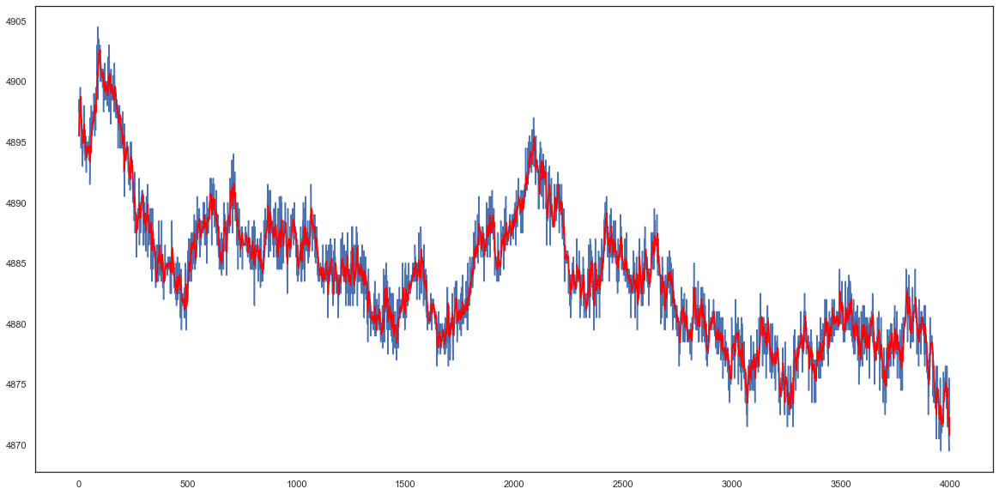

Test RMSE: 1.344


In [42]:
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
for day, assets in output_dfs.items():
    for asset, data in assets.items():
        if asset == 'BANANAS':
            train, test = data['mid_price'][:6000].values, data['mid_price'][6000:].values
            # pd.to_datetime(train)
            # pd.to_datetime(test)
            history = [x for x in train]
            predictions = list()
            # walk-forward validation
            for t in range(len(test)):
                model = ARIMA(history, order=(5,1,0))
                model_fit = model.fit()
                output = model_fit.forecast()
                yhat = output[0]
                predictions.append(yhat)
                obs = test[t]
                history.append(obs)
                # print('predicted=%f, expected=%f' % (yhat, obs))
            # evaluate forecasts
            rmse = np.sqrt(mean_squared_error(test, predictions))
            plt.plot(test)
            plt.plot(predictions, color='red')
            plt.show()
            print('Test RMSE: %.3f' % rmse)

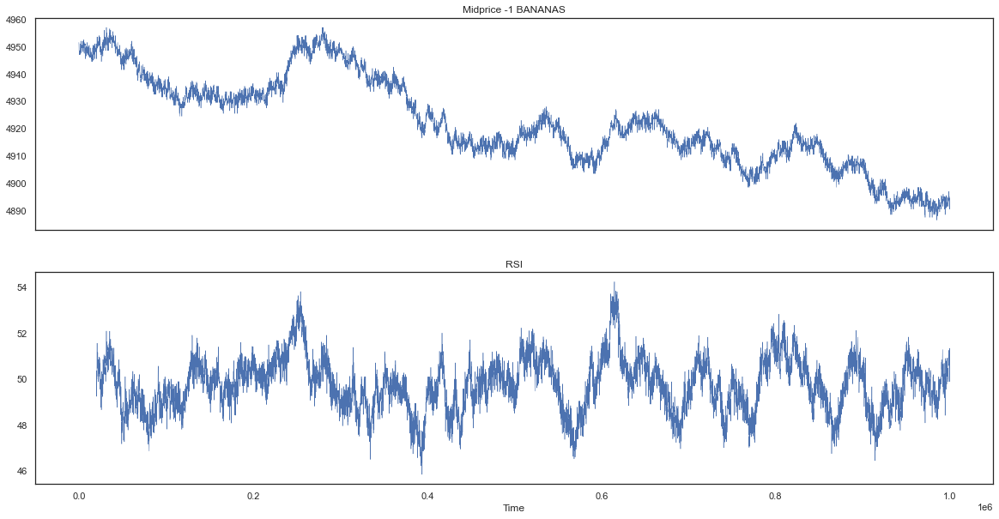

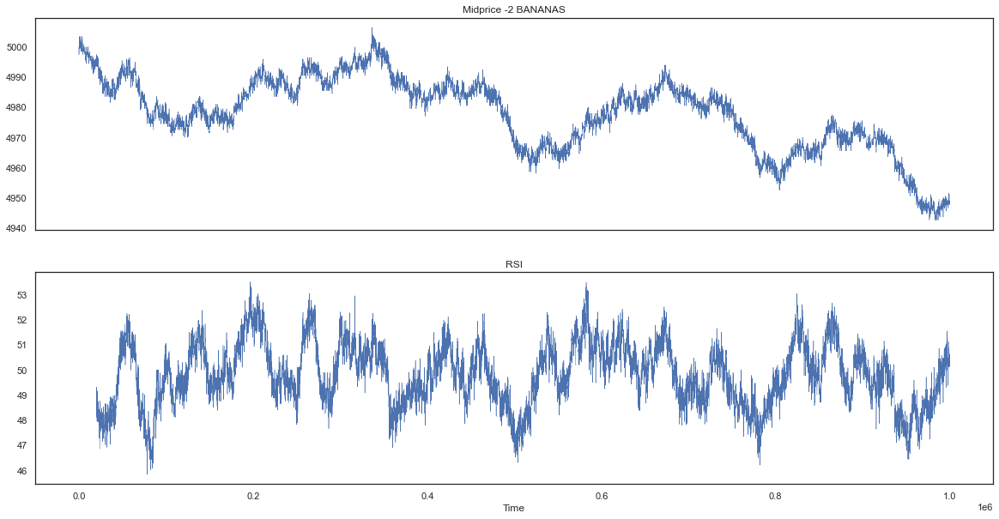

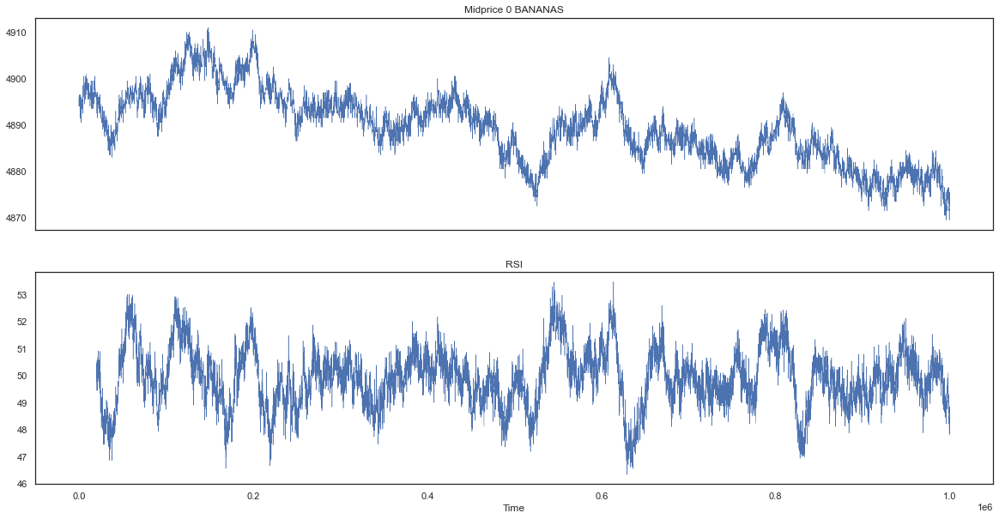

In [43]:
for day, assets in output_dfs.items():
    for asset, data in assets.items():
        if asset == 'BANANAS':
            period = 200
            fig, axs = plt.subplots(2, sharex=True)
            axs[0].plot(data['timestamp'], data['mid_price'] , linewidth = 0.5)
            axs[0].title.set_text(str('Midprice '+ str(day)+ ' '+ asset))
            rsi_sma = calc_rsi(data['mid_price'], lambda s: s.rolling(period).mean(), period)
            axs[1].plot(data['timestamp'][1:], rsi_sma, label = 'RSI', linewidth = 0.5)
            axs[1].title.set_text(str('RSI'))
            axs[1].set_xlabel('Time')
            plt.show()